In [529]:
# Import necessary libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, mean_squared_error, r2_score, roc_auc_score

# Libraries for explainability
import shap
from lime.lime_tabular import LimeTabularExplainer
from pdpbox import pdp, info_plots
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.utils import shuffle
from anchor import anchor_tabular
from docx import Document


# Model Libraries
import lightgbm as lgb
import catboost as cb
import xgboost as xgb

# Optimization and Time Management
import optuna
import datetime
from sklearn.model_selection import GridSearchCV
import lightgbm as lgb
from catboost import CatBoostRegressor
from xgboost import XGBRegressor



In [531]:
# Load the unified dataset
file_path = 'Unified_Dataset_2013_Onward_With_Indicators.csv'  # Adjust the path accordingly
unified_dataset = pd.read_csv(file_path, parse_dates=['Date'], index_col='Date')

# Define the split date for historical financial data
split_date = "2023-01-01"

# Split the dataset into training and test sets
training_dataset = unified_dataset[unified_dataset.index < split_date]
test_dataset = unified_dataset[unified_dataset.index >= split_date]

# Create the target variable for predicting upward or downward trend
target_column = 'Trend_Target'  # New column for binary trend prediction
unified_dataset[target_column] = (unified_dataset['Open_Eurostoxx50'].shift(-1) > unified_dataset['Open_Eurostoxx50']).astype(int)

# Split again to ensure the target variable is included
training_dataset = unified_dataset[unified_dataset.index < split_date]
test_dataset = unified_dataset[unified_dataset.index >= split_date]

# Save the datasets to CSV files
training_dataset.to_csv("Training_Dataset.csv")
test_dataset.to_csv("Test_Dataset.csv")

print("Training and test datasets have been successfully created and saved.")

Training and test datasets have been successfully created and saved.


In [533]:
# Check if the target column exists
if 'Open_Eurostoxx50' not in unified_dataset.columns:
    raise KeyError("The target column 'target' is not found in the dataset. Please verify the column name.")

In [535]:
# Define the features and target
X_train = training_dataset.drop(columns=[target_column])
y_train = training_dataset[target_column]
X_test = test_dataset.drop(columns=[target_column])
y_test = test_dataset[target_column]

# Print dataset details to verify loading and structure
print(f"Training Data Shape: {X_train.shape}")
print(f"Testing Data Shape: {X_test.shape}")
print(f"Columns in Dataset: {unified_dataset.columns.tolist()}")

# Save the cleaned dataset (optional)
unified_dataset.to_csv('cleaned_data.csv')

# Initialize the models with default parameters
lgb_model = lgb.LGBMClassifier(random_state=42)
cb_model = cb.CatBoostClassifier(verbose=0, random_state=42)
xgb_model = xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)

# Step 1: Baseline Training for LightGBM, CatBoost, and XGBoost
print("\nTraining LightGBM Model...")
lgb_model.fit(X_train, y_train)
lgb_preds = lgb_model.predict(X_test)
lgb_accuracy = accuracy_score(y_test, lgb_preds)
print(f"LightGBM Accuracy: {lgb_accuracy:.4f}")

print("\nTraining CatBoost Model...")
cb_model.fit(X_train, y_train)
cb_preds = cb_model.predict(X_test)
cb_accuracy = accuracy_score(y_test, cb_preds)
print(f"CatBoost Accuracy: {cb_accuracy:.4f}")

print("\nTraining XGBoost Model...")
xgb_model.fit(X_train, y_train)
xgb_preds = xgb_model.predict(X_test)
xgb_accuracy = accuracy_score(y_test, xgb_preds)
print(f"XGBoost Accuracy: {xgb_accuracy:.4f}")

# Baseline models are trained and evaluated!


Training Data Shape: (3369, 22)
Testing Data Shape: (706, 22)
Columns in Dataset: ['Open_Eurostoxx50', 'Close_Eurostoxx50', 'Volume_Eurostoxx50', 'Close_VSTOXX', 'Basel Temperature Mean_BaselTemp', 'Average close_EURIBOR', 'Open_Gold', 'Close_Gold', 'Europe Brent Spot Price FOB (Dollars per Barrel)_Oil', 'US dollar/Euro (EXR.D.USD.EUR.SP00.A)_Dollar', 'Eurostoxx50_Returns', 'Eurostoxx50_GARCH_Volatility', 'VSTOXX_GARCH_Volatility', 'Eurostoxx50_Cumulative_5D_Returns', 'Eurostoxx50_MA_50', 'Eurostoxx50_RSI', 'Eurostoxx50_MACD', 'Eurostoxx50_MACD_Signal', 'VSTOXX_MA_50', 'VSTOXX_RSI', 'VSTOXX_MACD', 'VSTOXX_MACD_Signal', 'Trend_Target']

Training LightGBM Model...
LightGBM Accuracy: 0.7054

Training CatBoost Model...
CatBoost Accuracy: 0.7210

Training XGBoost Model...
XGBoost Accuracy: 0.6955


In [537]:
# Ensure predictions are correctly added to the test dataset
test_dataset = test_dataset.copy()  # Avoid chained assignment issues
test_dataset['LightGBM_Prediction'] = lgb_model.predict(X_test)
test_dataset['CatBoost_Prediction'] = cb_model.predict(X_test)
test_dataset['XGBoost_Prediction'] = xgb_model.predict(X_test)

# Confirm the columns exist
print("Columns in test dataset after prediction:", test_dataset.columns)


Columns in test dataset after prediction: Index(['Open_Eurostoxx50', 'Close_Eurostoxx50', 'Volume_Eurostoxx50',
       'Close_VSTOXX', 'Basel Temperature Mean_BaselTemp',
       'Average close_EURIBOR', 'Open_Gold', 'Close_Gold',
       'Europe Brent Spot Price FOB (Dollars per Barrel)_Oil',
       'US dollar/Euro (EXR.D.USD.EUR.SP00.A)_Dollar', 'Eurostoxx50_Returns',
       'Eurostoxx50_GARCH_Volatility', 'VSTOXX_GARCH_Volatility',
       'Eurostoxx50_Cumulative_5D_Returns', 'Eurostoxx50_MA_50',
       'Eurostoxx50_RSI', 'Eurostoxx50_MACD', 'Eurostoxx50_MACD_Signal',
       'VSTOXX_MA_50', 'VSTOXX_RSI', 'VSTOXX_MACD', 'VSTOXX_MACD_Signal',
       'Trend_Target', 'LightGBM_Prediction', 'CatBoost_Prediction',
       'XGBoost_Prediction'],
      dtype='object')


In [539]:
# Portfolio Class with Certainty Tracking for All Decisions
class Portfolio:
    def __init__(self, initial_cash, max_trade_allocation=0.1, holding_period=5, min_stock_allocation=0.25):
        self.cash = initial_cash
        self.initial_cash = initial_cash
        self.max_trade_allocation = max_trade_allocation
        self.holding_period = holding_period
        self.min_stock_allocation = min_stock_allocation
        self.positions = {}
        self.portfolio_value = initial_cash
        self.portfolio_history = []
        self.transactions = []
        self.cumulative_profit = 0

    def update_portfolio_value(self, close_prices, date, certainty=None):
        invested_value = sum(
            position['amount'] * close_prices[symbol]
            for symbol, position in self.positions.items()
            if symbol in close_prices
        )
        self.portfolio_value = self.cash + invested_value
        # Ensure certainty is logged for all decisions, defaulting to 0 if None
        self.transactions.append({
            'date': date,
            'symbol': 'No Trade',
            'price': self.portfolio_value,
            'action': 'hold',
            'certainty': certainty if certainty is not None else 0
        })
        self.log_portfolio_value(date, invested_value, certainty if certainty is not None else 0)

    def log_portfolio_value(self, date, invested_value, certainty=None):
        self.portfolio_history.append({
            'date': date,
            'total_value': self.portfolio_value,
            'cash': max(0, self.cash),
            'invested': invested_value,
            'cumulative_profit': self.cumulative_profit,
            'certainty': certainty if certainty is not None else 0
        })

    def buy(self, symbol, open_price, certainty, date, max_certainty=1.0, stop_loss=None):
        allocation_factor =  1# min(certainty / max_certainty,)
        max_investment = self.portfolio_value * self.max_trade_allocation
        investment_amount = min(self.cash, max_investment * allocation_factor)
        num_units = int(investment_amount // open_price)
        total_cost = num_units * open_price

        self.transactions.append({'date': date, 'symbol': symbol, 'price': open_price, 'action': 'buy', 'certainty': certainty})

        if num_units <= 0:
            print(f"Not enough cash to buy even one unit of {symbol}.")
            return

        self.cash -= total_cost
        if symbol in self.positions:
            position = self.positions[symbol]
            total_investment = (position['amount'] * position['average_buy_price']) + total_cost
            new_amount = position['amount'] + num_units
            position['average_buy_price'] = total_investment / new_amount
            position['amount'] = new_amount
        else:
            self.positions[symbol] = {
                'amount': num_units,
                'average_buy_price': open_price,
                'purchase_date': date,
                'stop_loss': open_price * (1 - stop_loss) if stop_loss else None
            }

    def sell(self, symbol, open_price, certainty, date, max_certainty=1.0):
        self.transactions.append({'date': date, 'symbol': symbol, 'price': open_price, 'action': 'sell', 'certainty': certainty})

        if symbol not in self.positions or self.positions[symbol]['amount'] <= 0:
            print(f"No position in {symbol} to sell.")
            return

        holding_duration = (date - self.positions[symbol]['purchase_date']).days
        if holding_duration < self.holding_period:
            print(f"Holding period not met for {symbol}. Holding duration: {holding_duration} days.")
            return

        invested_value = sum(position['amount'] * position['average_buy_price'] for position in self.positions.values())
        total_value = self.cash + invested_value

        if invested_value / total_value <= self.min_stock_allocation:
            print(f"Cannot sell as it would reduce stock allocation below {self.min_stock_allocation * 100:.2f}%")
            return

        allocation_factor = 1 #min( certainty / max_certainty,)
        num_units_to_sell = int(self.positions[symbol]['amount'] * allocation_factor)

        if num_units_to_sell <= 0:
            print(f"Not enough whole units to sell for {symbol}.")
            return

        sell_value = num_units_to_sell * open_price
        self.cash += sell_value
        trade_profit = (open_price - self.positions[symbol]['average_buy_price']) * num_units_to_sell
        self.cumulative_profit += trade_profit
        self.positions[symbol]['amount'] -= num_units_to_sell

        if self.positions[symbol]['amount'] <= 0:
            del self.positions[symbol]

    def get_portfolio_allocation(self):
        invested_value = sum(position['amount'] * position['average_buy_price'] for position in self.positions.values())
        total_value = self.cash + invested_value
        cash_percentage = self.cash / total_value if total_value > 0 else 0
        invested_percentage = invested_value / total_value if total_value > 0 else 0
        return {'cash_percentage': cash_percentage, 'invested_percentage': invested_percentage}

    def display_portfolio_status(self):
        allocation = self.get_portfolio_allocation()
        print(f"Portfolio Value: ${self.portfolio_value:.2f}")
        print(f"Cash: ${self.cash:.2f} ({allocation['cash_percentage'] * 100:.2f}%)")
        print(f"Invested: {allocation['invested_percentage'] * 100:.2f}%")
        print(f"Cumulative Profit: ${self.cumulative_profit:.2f}")
        print("Positions:")
        for symbol, position in self.positions.items():
            print(f" - {symbol}: {position['amount']} units, Average Buy Price: {position['average_buy_price']:.2f}")


In [ ]:
# Portfolio Simulation with All Three Models and Certainty Filtering

# Define certainty threshold
certainty_threshold = 0.5
# Initialize a portfolio for each model
portfolio_lgb = Portfolio(initial_cash=100000)
portfolio_cb = Portfolio(initial_cash=100000)
portfolio_xgb = Portfolio(initial_cash=100000)

# Add predictions and certainty to the test dataset
test_dataset['LightGBM_Prediction'] = lgb_preds
test_dataset['CatBoost_Prediction'] = cb_preds
test_dataset['XGBoost_Prediction'] = xgb_preds
test_dataset['LightGBM_Certainty'] = np.abs(lgb_model.predict_proba(X_test)[:, 1] - 0.5) * 2
test_dataset['CatBoost_Certainty'] = np.abs(cb_model.predict_proba(X_test)[:, 1] - 0.5) * 2
test_dataset['XGBoost_Certainty'] = np.abs(xgb_model.predict_proba(X_test)[:, 1] - 0.5) * 2

# Simulate portfolio performance for each model with certainty threshold
for index, row in test_dataset.iterrows():
    price = row['Open_Eurostoxx50']
    # LightGBM Portfolio
    portfolio_lgb.update_portfolio_value({'Eurostoxx50': price}, index, certainty=row['LightGBM_Certainty'])
    if row['LightGBM_Prediction'] == 1 and row['LightGBM_Certainty'] >= certainty_threshold:
        portfolio_lgb.buy('Eurostoxx50', price, certainty=row['LightGBM_Certainty'], date=index)
    elif row['LightGBM_Prediction'] == 0 and row['LightGBM_Certainty'] >= certainty_threshold:
        portfolio_lgb.sell('Eurostoxx50', price, certainty=row['LightGBM_Certainty'], date=index)

    # CatBoost Portfolio
    portfolio_cb.update_portfolio_value({'Eurostoxx50': price}, index, certainty=row['CatBoost_Certainty'])
    if row['CatBoost_Prediction'] == 1 and row['CatBoost_Certainty'] >= certainty_threshold:
        portfolio_cb.buy('Eurostoxx50', price, certainty=row['CatBoost_Certainty'], date=index)
    elif row['CatBoost_Prediction'] == 0 and row['CatBoost_Certainty'] >= certainty_threshold:
        portfolio_cb.sell('Eurostoxx50', price, certainty=row['CatBoost_Certainty'], date=index)

    # XGBoost Portfolio
    portfolio_xgb.update_portfolio_value({'Eurostoxx50': price}, index, certainty=row['XGBoost_Certainty'])
    if row['XGBoost_Prediction'] == 1 and row['XGBoost_Certainty'] >= certainty_threshold:
        portfolio_xgb.buy('Eurostoxx50', price, certainty=row['XGBoost_Certainty'], date=index)
    elif row['XGBoost_Prediction'] == 0 and row['XGBoost_Certainty'] >= certainty_threshold:
        portfolio_xgb.sell('Eurostoxx50', price, certainty=row['XGBoost_Certainty'], date=index)

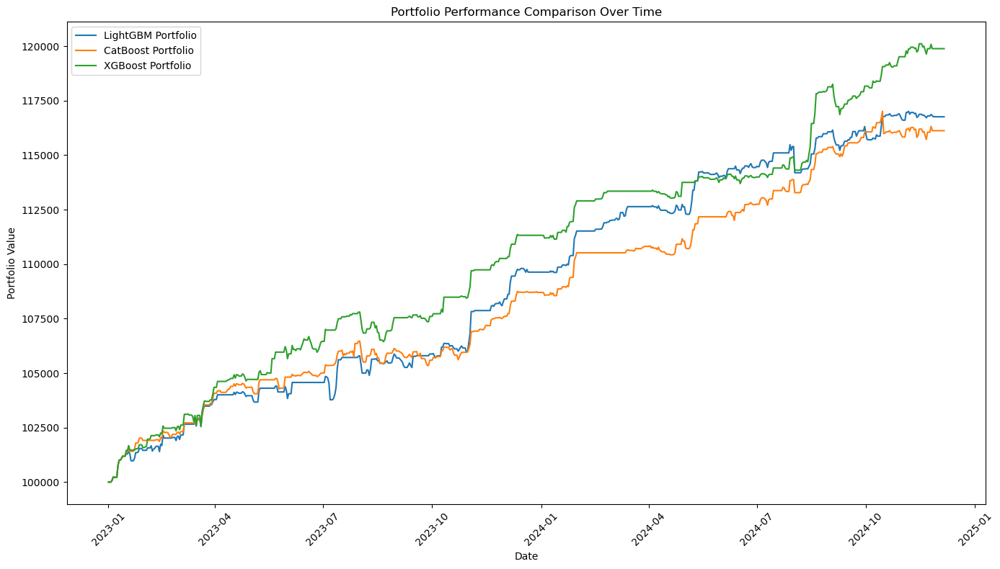

In [573]:
# Plot Portfolio Performance with Dates
plt.figure(figsize=(14, 8))
plt.plot([entry['date'] for entry in portfolio_lgb.portfolio_history],
         [entry['total_value'] for entry in portfolio_lgb.portfolio_history], label='LightGBM Portfolio')
plt.plot([entry['date'] for entry in portfolio_cb.portfolio_history],
         [entry['total_value'] for entry in portfolio_cb.portfolio_history], label='CatBoost Portfolio')
plt.plot([entry['date'] for entry in portfolio_xgb.portfolio_history],
         [entry['total_value'] for entry in portfolio_xgb.portfolio_history], label='XGBoost Portfolio')
plt.title('Portfolio Performance Comparison Over Time')
plt.xlabel('Date')
plt.ylabel('Portfolio Value')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [575]:
print("Training Dataset Date Range:")
print(training_dataset.index.min(), "to", training_dataset.index.max())

print("\nTest Dataset Date Range:")
print(test_dataset.index.min(), "to", test_dataset.index.max())


Training Dataset Date Range:
2013-10-11 00:00:00 to 2022-12-31 00:00:00

Test Dataset Date Range:
2023-01-01 00:00:00 to 2024-12-06 00:00:00


In [577]:
# Combine Training and Testing Datasets for Full Period Simulation
full_dataset = pd.concat([training_dataset, test_dataset])

# Ensure predictions and certainty values are added for both datasets
features_to_drop = [target_column, 'LightGBM_Prediction', 'CatBoost_Prediction', 'XGBoost_Prediction',
                    'LightGBM_Certainty', 'CatBoost_Certainty', 'XGBoost_Certainty']

# Drop the columns only if they exist in the dataset
feature_columns = [col for col in full_dataset.columns if col not in features_to_drop]

In [ ]:
# Portfolio Simulation with All Three Models and Certainty Filtering

# Define certainty threshold
certainty_threshold = 0.5

# Initialize a portfolio for each model
portfolio_lgb = Portfolio(initial_cash=100000)
portfolio_cb = Portfolio(initial_cash=100000)
portfolio_xgb = Portfolio(initial_cash=100000)

# Generate predictions and certainty scores correctly
full_dataset['LightGBM_Prediction'] = lgb_model.predict(full_dataset[feature_columns])
full_dataset['CatBoost_Prediction'] = cb_model.predict(full_dataset[feature_columns])
full_dataset['XGBoost_Prediction'] = xgb_model.predict(full_dataset[feature_columns])

# Certainty Calculation
full_dataset['LightGBM_Certainty'] = np.abs(lgb_model.predict_proba(full_dataset[feature_columns])[:, 1] - 0.5) * 2
full_dataset['CatBoost_Certainty'] = np.abs(cb_model.predict_proba(full_dataset[feature_columns])[:, 1] - 0.5) * 2
full_dataset['XGBoost_Certainty'] = np.abs(xgb_model.predict_proba(full_dataset[feature_columns])[:, 1] - 0.5) * 2

# Initialize Buy and Hold Strategy
buy_and_hold_value = 100000  # Initial cash
initial_price = full_dataset.iloc[0]['Open_Eurostoxx50']
buy_and_hold_units = buy_and_hold_value / initial_price

# Simulate portfolio performance over the full dataset
for index, row in full_dataset.iterrows():
    price = row['Open_Eurostoxx50']
    # LightGBM Portfolio
    portfolio_lgb.update_portfolio_value({'Eurostoxx50': price}, index, certainty=row['LightGBM_Certainty'])
    if row['LightGBM_Prediction'] == 1 and row['LightGBM_Certainty'] >= certainty_threshold:
        portfolio_lgb.buy('Eurostoxx50', price, certainty=row['LightGBM_Certainty'], date=index)
    elif row['LightGBM_Prediction'] == 0 and row['LightGBM_Certainty'] >= certainty_threshold:
        portfolio_lgb.sell('Eurostoxx50', price, certainty=row['LightGBM_Certainty'], date=index)

    # CatBoost Portfolio
    portfolio_cb.update_portfolio_value({'Eurostoxx50': price}, index, certainty=row['CatBoost_Certainty'])
    if row['CatBoost_Prediction'] == 1 and row['CatBoost_Certainty'] >= certainty_threshold:
        portfolio_cb.buy('Eurostoxx50', price, certainty=row['CatBoost_Certainty'], date=index)
    elif row['CatBoost_Prediction'] == 0 and row['CatBoost_Certainty'] >= certainty_threshold:
        portfolio_cb.sell('Eurostoxx50', price, certainty=row['CatBoost_Certainty'], date=index)

    # XGBoost Portfolio
    portfolio_xgb.update_portfolio_value({'Eurostoxx50': price}, index, certainty=row['XGBoost_Certainty'])
    if row['XGBoost_Prediction'] == 1 and row['XGBoost_Certainty'] >= certainty_threshold:
        portfolio_xgb.buy('Eurostoxx50', price, certainty=row['XGBoost_Certainty'], date=index)
    elif row['XGBoost_Prediction'] == 0 and row['XGBoost_Certainty'] >= certainty_threshold:
        portfolio_xgb.sell('Eurostoxx50', price, certainty=row['XGBoost_Certainty'], date=index)

    # Buy and Hold Value Update
    buy_and_hold_value = buy_and_hold_units * price



In [581]:
from datetime import datetime

# Ensure split_date is a datetime object
if isinstance(split_date, str):
    split_date = datetime.strptime(split_date, '%Y-%m-%d')  # Adjust the format if needed

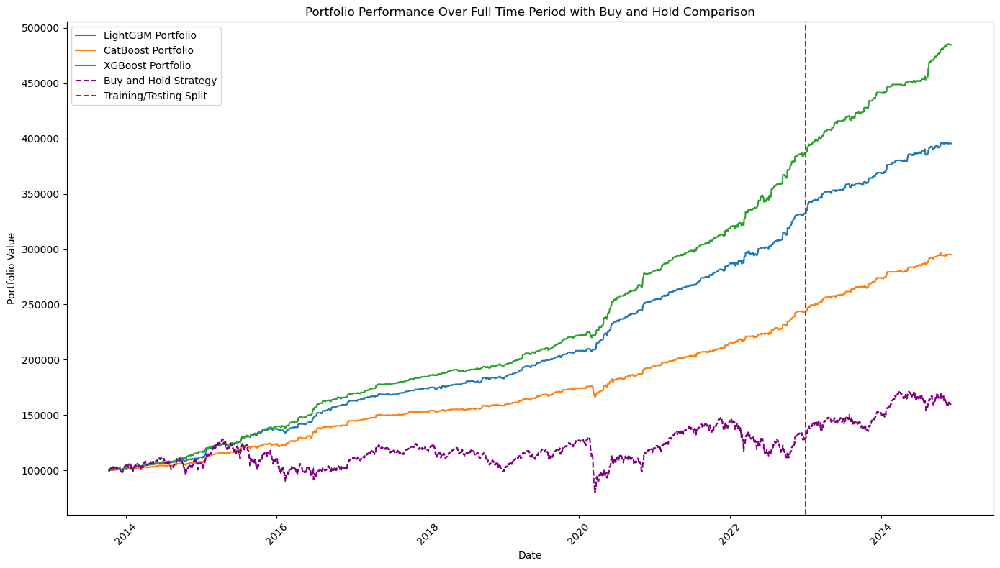

In [583]:
# Plot Portfolio Performance with Dates and Training/Testing Split
plt.figure(figsize=(14, 8))
plt.plot([entry['date'] for entry in portfolio_lgb.portfolio_history],
         [entry['total_value'] for entry in portfolio_lgb.portfolio_history], label='LightGBM Portfolio')
plt.plot([entry['date'] for entry in portfolio_cb.portfolio_history],
         [entry['total_value'] for entry in portfolio_cb.portfolio_history], label='CatBoost Portfolio')
plt.plot([entry['date'] for entry in portfolio_xgb.portfolio_history],
         [entry['total_value'] for entry in portfolio_xgb.portfolio_history], label='XGBoost Portfolio')

# Add Buy and Hold Strategy to the Plot
plt.plot(full_dataset.index, [buy_and_hold_units * price for price in full_dataset['Open_Eurostoxx50']], 
         label='Buy and Hold Strategy', linestyle='--', color='purple')

# Mark the training/testing split
plt.axvline(split_date, color='red', linestyle='--', label='Training/Testing Split')

plt.title('Portfolio Performance Over Full Time Period with Buy and Hold Comparison')
plt.xlabel('Date')
plt.ylabel('Portfolio Value')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

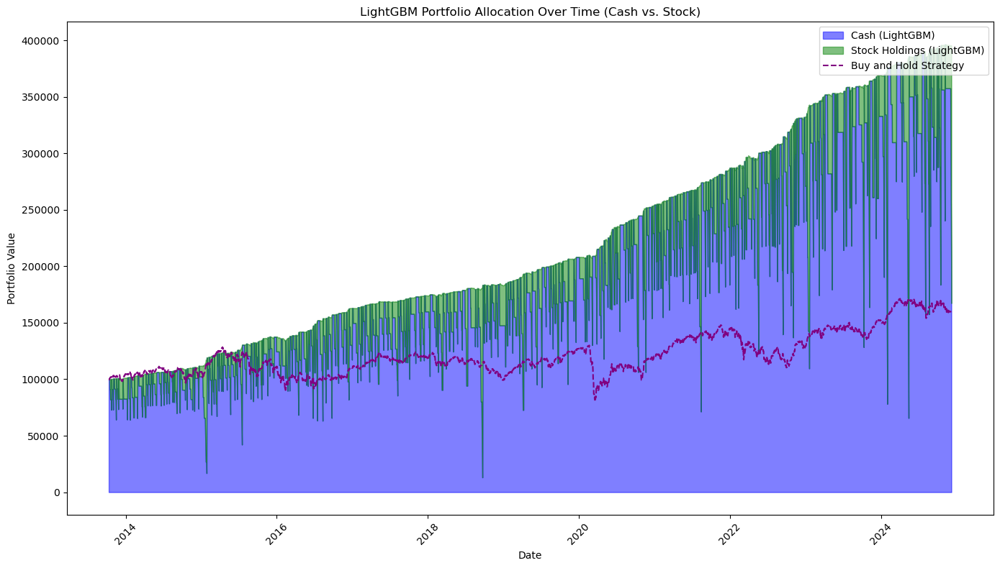

In [585]:


# LightGBM Portfolio
plt.figure(figsize=(14, 8))
lgb_cash = [entry['cash'] for entry in portfolio_lgb.portfolio_history]
lgb_invested = [entry['invested'] for entry in portfolio_lgb.portfolio_history]
lgb_dates = [entry['date'] for entry in portfolio_lgb.portfolio_history]

plt.fill_between(lgb_dates, lgb_cash, label='Cash (LightGBM)', color='blue', alpha=0.5)
plt.fill_between(lgb_dates, [lgb_cash[i] + lgb_invested[i] for i in range(len(lgb_cash))],
                 lgb_cash, label='Stock Holdings (LightGBM)', color='green', alpha=0.5)
plt.plot(full_dataset.index, [buy_and_hold_units * price for price in full_dataset['Open_Eurostoxx50']], 
         label='Buy and Hold Strategy', linestyle='--', color='purple')
plt.title('LightGBM Portfolio Allocation Over Time (Cash vs. Stock)')
plt.xlabel('Date')
plt.ylabel('Portfolio Value')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()




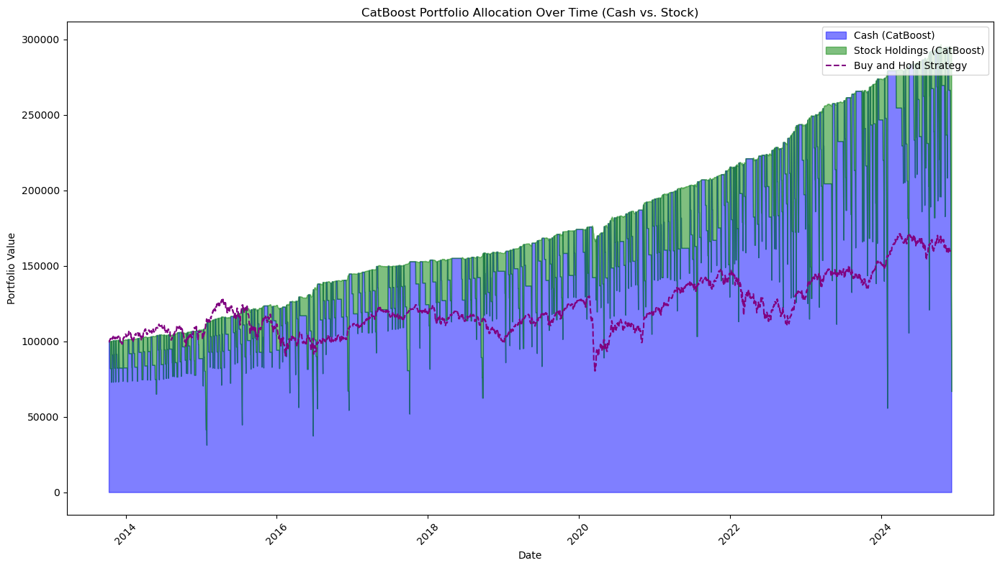

In [587]:
# CatBoost Portfolio
plt.figure(figsize=(14, 8))
cb_cash = [entry['cash'] for entry in portfolio_cb.portfolio_history]
cb_invested = [entry['invested'] for entry in portfolio_cb.portfolio_history]
cb_dates = [entry['date'] for entry in portfolio_cb.portfolio_history]

plt.fill_between(cb_dates, cb_cash, label='Cash (CatBoost)', color='blue', alpha=0.5)
plt.fill_between(cb_dates, [cb_cash[i] + cb_invested[i] for i in range(len(cb_cash))],
                 cb_cash, label='Stock Holdings (CatBoost)', color='green', alpha=0.5)
plt.plot(full_dataset.index, [buy_and_hold_units * price for price in full_dataset['Open_Eurostoxx50']], 
         label='Buy and Hold Strategy', linestyle='--', color='purple')
plt.title('CatBoost Portfolio Allocation Over Time (Cash vs. Stock)')
plt.xlabel('Date')
plt.ylabel('Portfolio Value')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



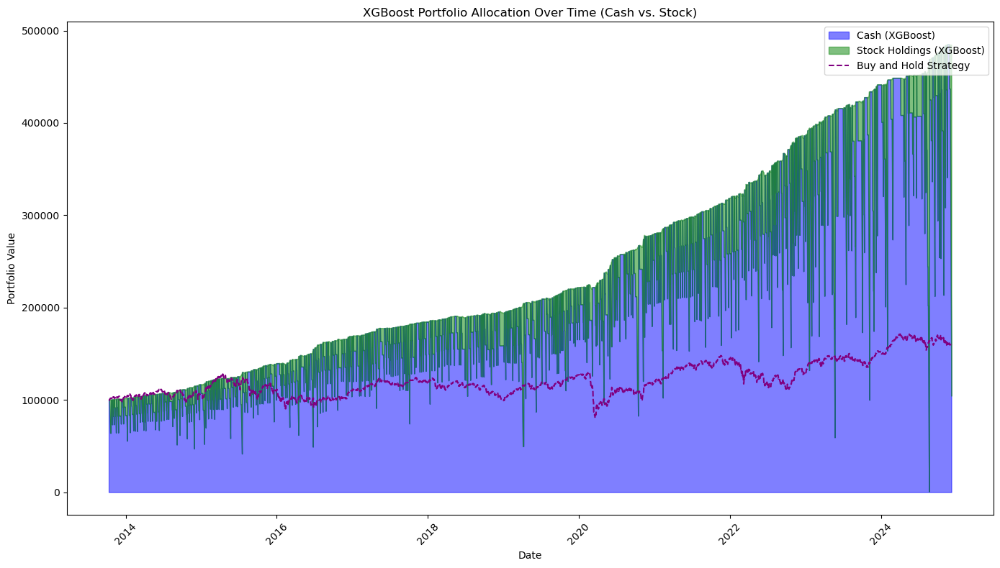

In [589]:
# XGBoost Portfolio
plt.figure(figsize=(14, 8))
xgb_cash = [entry['cash'] for entry in portfolio_xgb.portfolio_history]
xgb_invested = [entry['invested'] for entry in portfolio_xgb.portfolio_history]
xgb_dates = [entry['date'] for entry in portfolio_xgb.portfolio_history]

plt.fill_between(xgb_dates, xgb_cash, label='Cash (XGBoost)', color='blue', alpha=0.5)
plt.fill_between(xgb_dates, [xgb_cash[i] + xgb_invested[i] for i in range(len(xgb_cash))],
                 xgb_cash, label='Stock Holdings (XGBoost)', color='green', alpha=0.5)
plt.plot(full_dataset.index, [buy_and_hold_units * price for price in full_dataset['Open_Eurostoxx50']], 
         label='Buy and Hold Strategy', linestyle='--', color='purple')
plt.title('XGBoost Portfolio Allocation Over Time (Cash vs. Stock)')
plt.xlabel('Date')
plt.ylabel('Portfolio Value')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


LightGBM Final Portfolio Value: $395530.13
CatBoost Final Portfolio Value: $295066.55
XGBoost Final Portfolio Value: $484724.79
Buy and Hold Final Portfolio Value: $159826.68
LightGBM ROI: 295.53%
CatBoost ROI: 195.07%
XGBoost ROI: 384.72%
Buy and Hold ROI: 59.83%


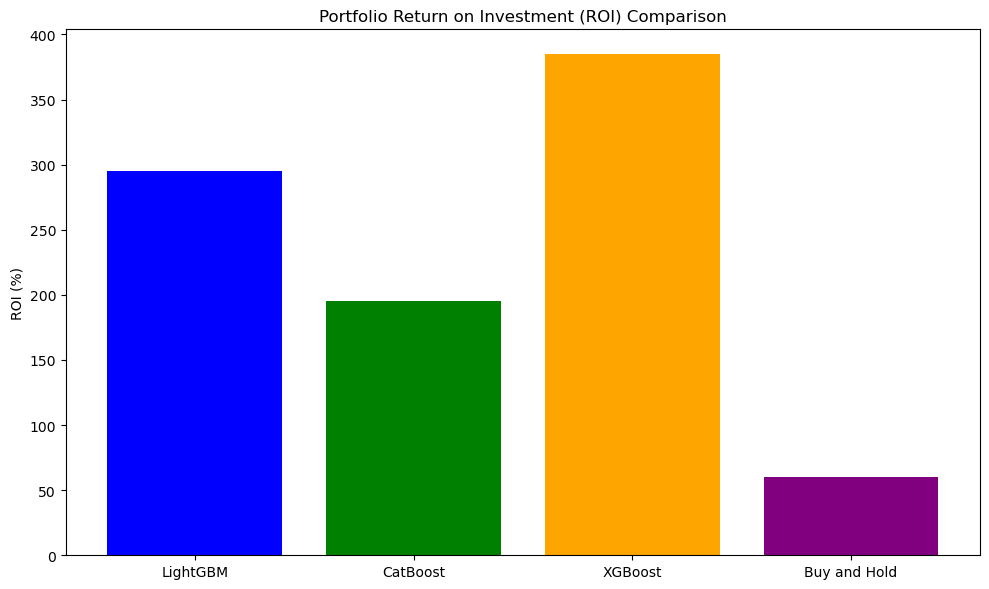

In [591]:
# Calculate and Compare Portfolio Performance for LightGBM, CatBoost, XGBoost, and Buy and Hold

# Final portfolio values
lgb_final_value = portfolio_lgb.portfolio_history[-1]['total_value']
cb_final_value = portfolio_cb.portfolio_history[-1]['total_value']
xgb_final_value = portfolio_xgb.portfolio_history[-1]['total_value']
buy_and_hold_final_value = buy_and_hold_units * full_dataset.iloc[-1]['Open_Eurostoxx50']

# Calculate Return on Investment (ROI)
lgb_roi = ((lgb_final_value - portfolio_lgb.initial_cash) / portfolio_lgb.initial_cash) * 100
cb_roi = ((cb_final_value - portfolio_cb.initial_cash) / portfolio_cb.initial_cash) * 100
xgb_roi = ((xgb_final_value - portfolio_xgb.initial_cash) / portfolio_xgb.initial_cash) * 100
buy_and_hold_roi = ((buy_and_hold_final_value - portfolio_lgb.initial_cash) / portfolio_lgb.initial_cash) * 100

# Print Performance Results
print(f"LightGBM Final Portfolio Value: ${lgb_final_value:.2f}")
print(f"CatBoost Final Portfolio Value: ${cb_final_value:.2f}")
print(f"XGBoost Final Portfolio Value: ${xgb_final_value:.2f}")
print(f"Buy and Hold Final Portfolio Value: ${buy_and_hold_final_value:.2f}")

print(f"LightGBM ROI: {lgb_roi:.2f}%")
print(f"CatBoost ROI: {cb_roi:.2f}%")
print(f"XGBoost ROI: {xgb_roi:.2f}%")
print(f"Buy and Hold ROI: {buy_and_hold_roi:.2f}%")

# Bar plot comparing the performance
import matplotlib.pyplot as plt

models = ['LightGBM', 'CatBoost', 'XGBoost', 'Buy and Hold']
roi_values = [lgb_roi, cb_roi, xgb_roi, buy_and_hold_roi]

plt.figure(figsize=(10, 6))
plt.bar(models, roi_values, color=['blue', 'green', 'orange', 'purple'])
plt.title('Portfolio Return on Investment (ROI) Comparison')
plt.ylabel('ROI (%)')
plt.tight_layout()
plt.show()

In [593]:


# Final portfolio values (after 01.01.2023)
portfolio_lgb_filtered = [entry for entry in portfolio_lgb.portfolio_history if entry['date'] >= split_date]
portfolio_cb_filtered = [entry for entry in portfolio_cb.portfolio_history if entry['date'] >= split_date]
portfolio_xgb_filtered = [entry for entry in portfolio_xgb.portfolio_history if entry['date'] >= split_date]

lgb_final_value = portfolio_lgb_filtered[-1]['total_value']
cb_final_value = portfolio_cb_filtered[-1]['total_value']
xgb_final_value = portfolio_xgb_filtered[-1]['total_value']

# Adjust Buy and Hold for split date
buy_and_hold_start_value = buy_and_hold_units * full_dataset[full_dataset.index == split_date].iloc[0]['Open_Eurostoxx50']
buy_and_hold_final_value = buy_and_hold_units * full_dataset[full_dataset.index >= split_date].iloc[-1]['Open_Eurostoxx50']

# Calculate Return on Investment (ROI) for the test period
lgb_roi = ((lgb_final_value - buy_and_hold_start_value) / buy_and_hold_start_value) * 100
cb_roi = ((cb_final_value - buy_and_hold_start_value) / buy_and_hold_start_value) * 100
xgb_roi = ((xgb_final_value - buy_and_hold_start_value) / buy_and_hold_start_value) * 100
buy_and_hold_roi = ((buy_and_hold_final_value - buy_and_hold_start_value) / buy_and_hold_start_value) * 100

# Ensure returns are being calculated separately for each portfolio
lgb_returns = pd.Series([entry['total_value'] for entry in portfolio_lgb.portfolio_history]).pct_change().dropna()
cb_returns = pd.Series([entry['total_value'] for entry in portfolio_cb.portfolio_history]).pct_change().dropna()
xgb_returns = pd.Series([entry['total_value'] for entry in portfolio_xgb.portfolio_history]).pct_change().dropna()


# Calculate Risk-Adjusted Metrics (Sharpe Ratio and Volatility)
def calculate_sharpe_ratio(returns, risk_free_rates):
    excess_returns = [r - rf / 100 for r, rf in zip(returns, risk_free_rates)]
    return np.mean(excess_returns) / np.std(excess_returns)

def calculate_average_volatility(returns, trading_days=252):
    # Annualize the standard deviation of returns for the entire period
    return np.std(cb_returns) * np.sqrt(trading_days)

# Function for rolling annualized volatility using returns
def calculate_rolling_volatility(returns, window=252, trading_days=252):
    # Annualize the rolling standard deviation of returns
    return returns.rolling(window=window).std() * np.sqrt(trading_days)
    
    
# Ensure Risk-Free Rate Extraction is Correct
risk_free_rates = full_dataset.loc[full_dataset.index >= split_date, 'Average close_EURIBOR'].values

# Calculate Sharpe Ratio
lgb_sharpe = calculate_sharpe_ratio(lgb_returns, risk_free_rates)
cb_sharpe = calculate_sharpe_ratio(cb_returns, risk_free_rates)
xgb_sharpe = calculate_sharpe_ratio(xgb_returns, risk_free_rates)

# Calculate overall average volatility using returns
lgb_volatility_avg = calculate_average_volatility(lgb_returns)
cb_volatility_avg = calculate_average_volatility(cb_returns)
xgb_volatility_avg = calculate_average_volatility(xgb_returns)

# Calculate rolling volatility using returns
lgb_volatility_rolling = calculate_rolling_volatility(lgb_returns)
cb_volatility_rolling = calculate_rolling_volatility(cb_returns)
xgb_volatility_rolling = calculate_rolling_volatility(xgb_returns)

# Print overall average volatility values
print(f"LGBM Average Volatility: {lgb_volatility_avg}")
print(f"CatBoost Average Volatility: {cb_volatility_avg}")
print(f"XGBoost Average Volatility: {xgb_volatility_avg}")

print(f"LGBM Variance: {np.var(lgb_returns)}")
print(f"CatBoost Variance: {np.var(cb_returns)}")
print(f"XGBoost Variance: {np.var(xgb_returns)}")



# Calculate median volatility for each model
lgb_median_vol = calculate_median_volatility(lgb_returns)
cb_median_vol = calculate_median_volatility(cb_returns)
xgb_median_vol = calculate_median_volatility(xgb_returns)


LGBM Average Volatility: 0.02461157780062225
CatBoost Average Volatility: 0.02461157780062225
XGBoost Average Volatility: 0.02461157780062225
LGBM Variance: 2.471994961267597e-06
CatBoost Variance: 2.4036895310955637e-06
XGBoost Variance: 2.731347545785514e-06


In [595]:
# Recalculate returns for the testing period only
lgb_returns_test = pd.Series([entry['total_value'] for entry in portfolio_lgb.portfolio_history if entry['date'] >= split_date]).pct_change().dropna()
cb_returns_test = pd.Series([entry['total_value'] for entry in portfolio_cb.portfolio_history if entry['date'] >= split_date]).pct_change().dropna()
xgb_returns_test = pd.Series([entry['total_value'] for entry in portfolio_xgb.portfolio_history if entry['date'] >= split_date]).pct_change().dropna()

# Calculate average volatility only for the testing period
lgb_volatility_avg_test = calculate_average_volatility(lgb_returns_test)
cb_volatility_avg_test = calculate_average_volatility(cb_returns_test)
xgb_volatility_avg_test = calculate_average_volatility(xgb_returns_test)

# Print the results for the test set only
print(f"LGBM Average Volatility (Testing Period): {lgb_volatility_avg_test}")
print(f"CatBoost Average Volatility (Testing Period): {cb_volatility_avg_test}")
print(f"XGBoost Average Volatility (Testing Period): {xgb_volatility_avg_test}")

LGBM Average Volatility (Testing Period): 0.02461157780062225
CatBoost Average Volatility (Testing Period): 0.02461157780062225
XGBoost Average Volatility (Testing Period): 0.02461157780062225


In [597]:
# Check correlation between return series
correlation_matrix = pd.DataFrame({
    'LGBM': lgb_returns,
    'CatBoost': cb_returns,
    'XGBoost': xgb_returns
}).corr()

print("Return Correlation Matrix:")
print(correlation_matrix)

Return Correlation Matrix:
              LGBM  CatBoost   XGBoost
LGBM      1.000000  0.773900  0.821422
CatBoost  0.773900  1.000000  0.751446
XGBoost   0.821422  0.751446  1.000000


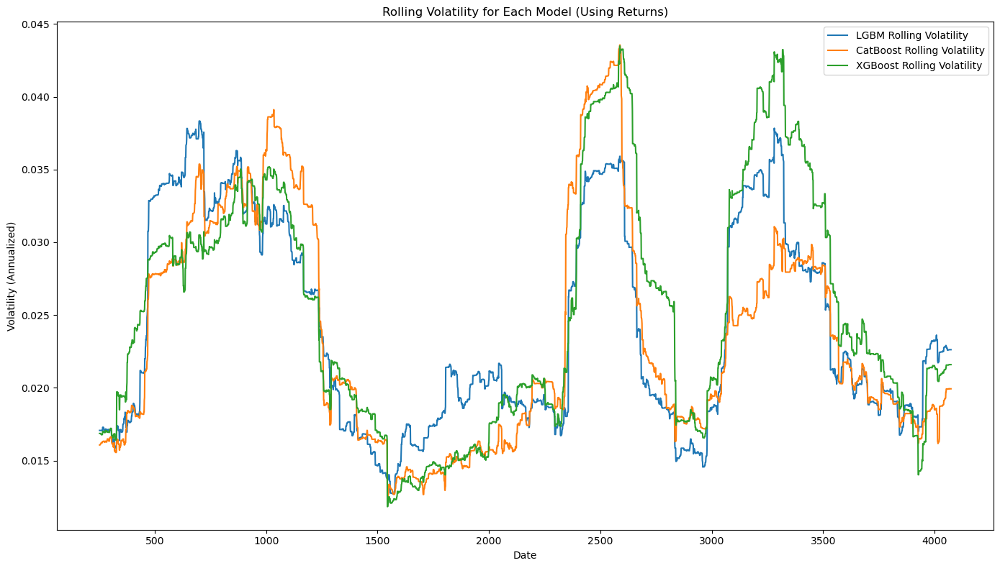

In [599]:
# Plot the rolling volatility over time
plt.figure(figsize=(14, 8))
plt.plot(lgb_volatility_rolling, label='LGBM Rolling Volatility')
plt.plot(cb_volatility_rolling, label='CatBoost Rolling Volatility')
plt.plot(xgb_volatility_rolling, label='XGBoost Rolling Volatility')

plt.title('Rolling Volatility for Each Model (Using Returns)')
plt.xlabel('Date')
plt.ylabel('Volatility (Annualized)')
plt.legend()
plt.tight_layout()
plt.show()

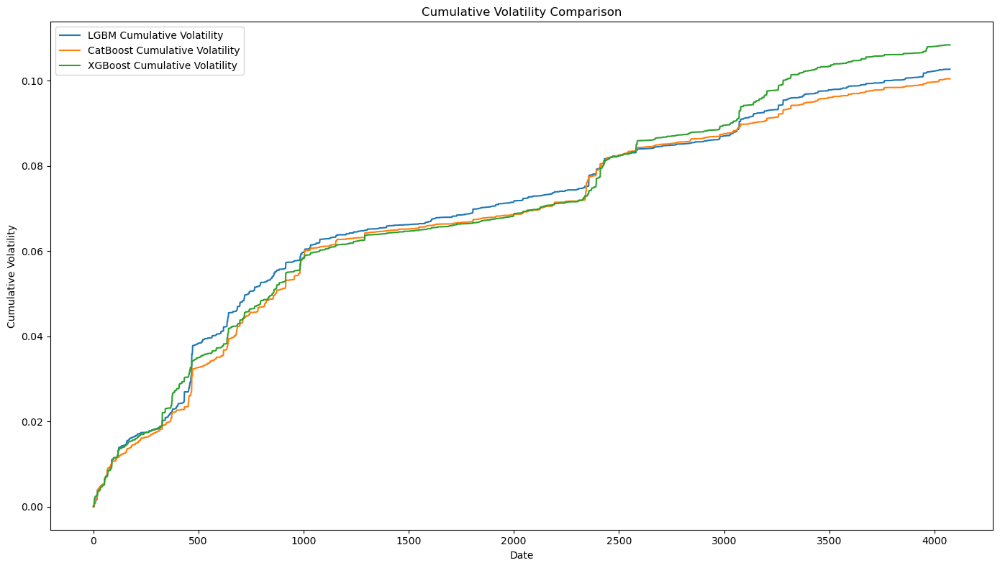

In [601]:
# Cumulative standard deviation for the entire timeline
lgb_cum_vol = np.cumsum(lgb_returns**2)**0.5
cb_cum_vol = np.cumsum(cb_returns**2)**0.5
xgb_cum_vol = np.cumsum(xgb_returns**2)**0.5

# Plot cumulative volatility
plt.figure(figsize=(14, 8))
plt.plot(lgb_cum_vol, label='LGBM Cumulative Volatility')
plt.plot(cb_cum_vol, label='CatBoost Cumulative Volatility')
plt.plot(xgb_cum_vol, label='XGBoost Cumulative Volatility')

plt.title('Cumulative Volatility Comparison')
plt.xlabel('Date')
plt.ylabel('Cumulative Volatility')
plt.legend()
plt.tight_layout()
plt.show()


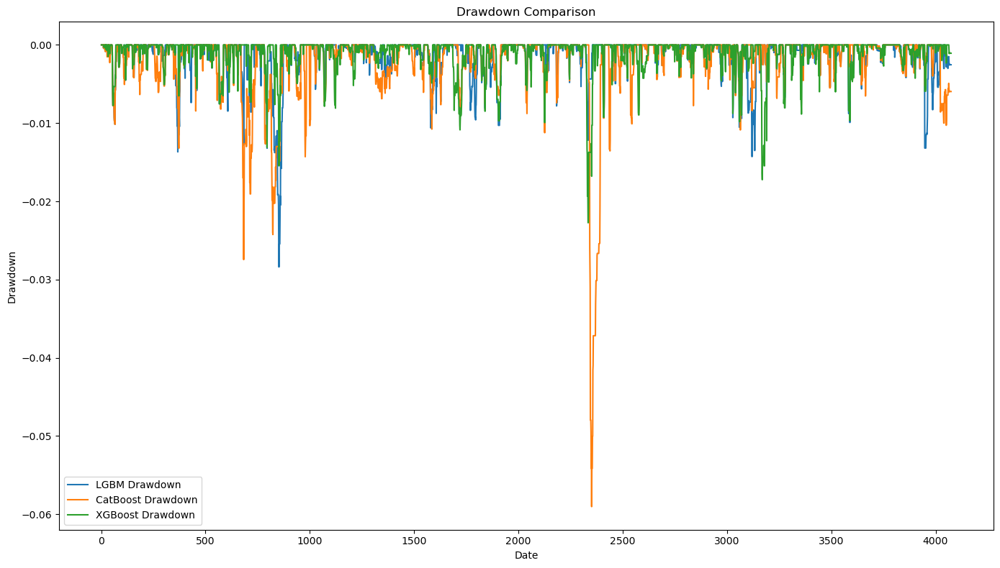

In [603]:
# Calculate drawdown for each model
def calculate_drawdown(returns):
    cumulative_returns = (1 + returns).cumprod()
    peak = cumulative_returns.cummax()
    drawdown = (cumulative_returns - peak) / peak
    return drawdown

# Calculate and plot drawdowns
lgb_drawdown = calculate_drawdown(lgb_returns)
cb_drawdown = calculate_drawdown(cb_returns)
xgb_drawdown = calculate_drawdown(xgb_returns)

plt.figure(figsize=(14, 8))
plt.plot(lgb_drawdown, label='LGBM Drawdown')
plt.plot(cb_drawdown, label='CatBoost Drawdown')
plt.plot(xgb_drawdown, label='XGBoost Drawdown')
plt.title('Drawdown Comparison')
plt.xlabel('Date')
plt.ylabel('Drawdown')
plt.legend()
plt.tight_layout()
plt.show()


In [604]:
print("LGBM Portfolio Values:", [entry['total_value'] for entry in portfolio_lgb.portfolio_history][:10])
print("CatBoost Portfolio Values:", [entry['total_value'] for entry in portfolio_cb.portfolio_history][:10])
print("XGBoost Portfolio Values:", [entry['total_value'] for entry in portfolio_xgb.portfolio_history][:10])


LGBM Portfolio Values: [100000, 100000, 100000, 100000, 100000, 100025.91967773438, 100073.34985351562, 100138.74926757812, 100138.74926757812, 100138.74926757812]
CatBoost Portfolio Values: [100000, 100000, 100000, 100000, 100000, 100025.91967773438, 100120.78002929688, 100186.17944335938, 100186.17944335938, 100186.17944335938]
XGBoost Portfolio Values: [100000, 100000, 100000, 100000, 100064.8603515625, 100116.69970703125, 100258.990234375, 100389.7890625, 100389.7890625, 100389.7890625]


In [607]:
print("LGBM Std Dev:", np.std(lgb_returns))
print("CatBoost Std Dev:", np.std(cb_returns))
print("XGBoost Std Dev:", np.std(xgb_returns))


LGBM Std Dev: 0.0015722579181761487
CatBoost Std Dev: 0.0015503836722229642
XGBoost Std Dev: 0.0016526788997822638


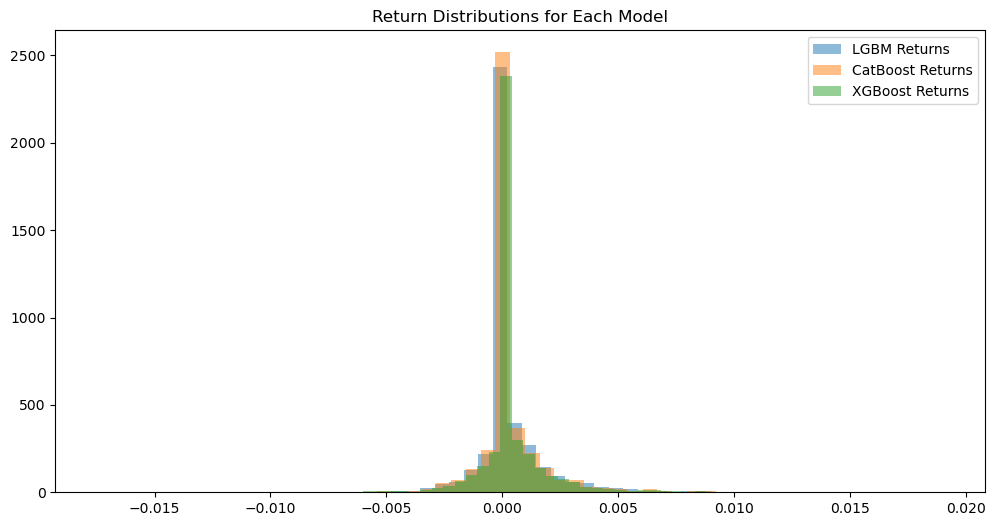

In [609]:
plt.figure(figsize=(12, 6))
plt.hist(lgb_returns, bins=50, alpha=0.5, label="LGBM Returns")
plt.hist(cb_returns, bins=50, alpha=0.5, label="CatBoost Returns")
plt.hist(xgb_returns, bins=50, alpha=0.5, label="XGBoost Returns")
plt.title("Return Distributions for Each Model")
plt.legend()
plt.show()


In [611]:
# Trade Frequency Analysis (number of trades vs. number of trading days)
def calculate_trade_frequency(transactions, start_date, end_date):
    total_trades = sum(1 for trade in transactions if trade['action'] in ['buy', 'sell'])
    total_days = (end_date - start_date).days
    trade_frequency = total_trades / total_days if total_days > 0 else 0
    return trade_frequency

lgb_trade_freq = calculate_trade_frequency(portfolio_lgb.transactions, split_date, full_dataset.index[-1])
cb_trade_freq = calculate_trade_frequency(portfolio_cb.transactions, split_date, full_dataset.index[-1])
xgb_trade_freq = calculate_trade_frequency(portfolio_xgb.transactions, split_date, full_dataset.index[-1])



In [613]:
print(f"LGB Returns Length: {len(lgb_returns)}")
print(f"CB Returns Length: {len(cb_returns)}")
print(f"XGB Returns Length: {len(xgb_returns)}")


LGB Returns Length: 4074
CB Returns Length: 4074
XGB Returns Length: 4074


In [615]:
# Print Performance Results with Risk Metrics

print(f"LightGBM ROI: {lgb_roi:.2f}%")
print(f"CatBoost ROI: {cb_roi:.2f}%")
print(f"XGBoost ROI: {xgb_roi:.2f}%")
print(f"Buy and Hold ROI: {buy_and_hold_roi:.2f}%")

print(f"LightGBM Sharpe Ratio: {lgb_sharpe:.2f}")
print(f"CatBoost Sharpe Ratio: {cb_sharpe:.2f}")
print(f"XGBoost Sharpe Ratio: {xgb_sharpe:.2f}")

print(f"LightGBM Volatility: {lgb_volatility:.2f}")
print(f"CatBoost Volatility: {cb_volatility:.2f}")
print(f"XGBoost Volatility: {xgb_volatility:.2f}")

print(f"LightGBM Trade Frequency: {lgb_trade_freq}")
print(f"CatBoost Trade Frequency: {cb_trade_freq}")
print(f"XGBoost Trade Frequency: {xgb_trade_freq}")


LightGBM ROI: 205.95%
CatBoost ROI: 128.24%
XGBoost ROI: 274.94%
Buy and Hold ROI: 23.63%
LightGBM Sharpe Ratio: -6.32
CatBoost Sharpe Ratio: -6.40
XGBoost Sharpe Ratio: -6.35
LightGBM Volatility: 0.02
CatBoost Volatility: 0.02
XGBoost Volatility: 0.02
LightGBM Trade Frequency: 4.04113475177305
CatBoost Trade Frequency: 3.5815602836879434
XGBoost Trade Frequency: 5.137588652482269


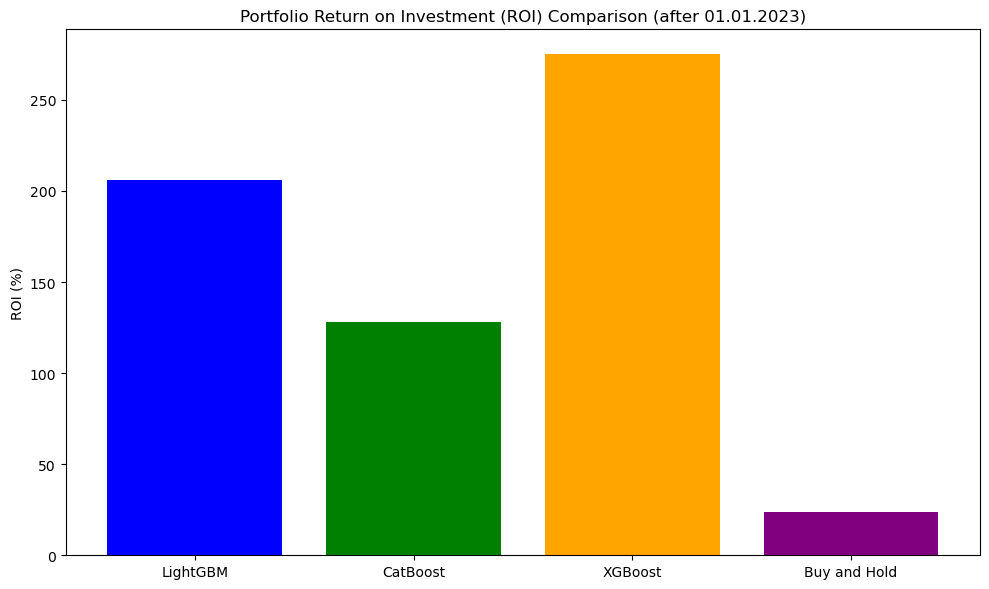

In [617]:
# Bar plot comparing the performance

models = ['LightGBM', 'CatBoost', 'XGBoost', 'Buy and Hold']
roi_values = [lgb_roi, cb_roi, xgb_roi, buy_and_hold_roi]

plt.figure(figsize=(10, 6))
plt.bar(models, roi_values, color=['blue', 'green', 'orange', 'purple'])
plt.title('Portfolio Return on Investment (ROI) Comparison (after 01.01.2023)')
plt.ylabel('ROI (%)')
plt.tight_layout()
plt.show()


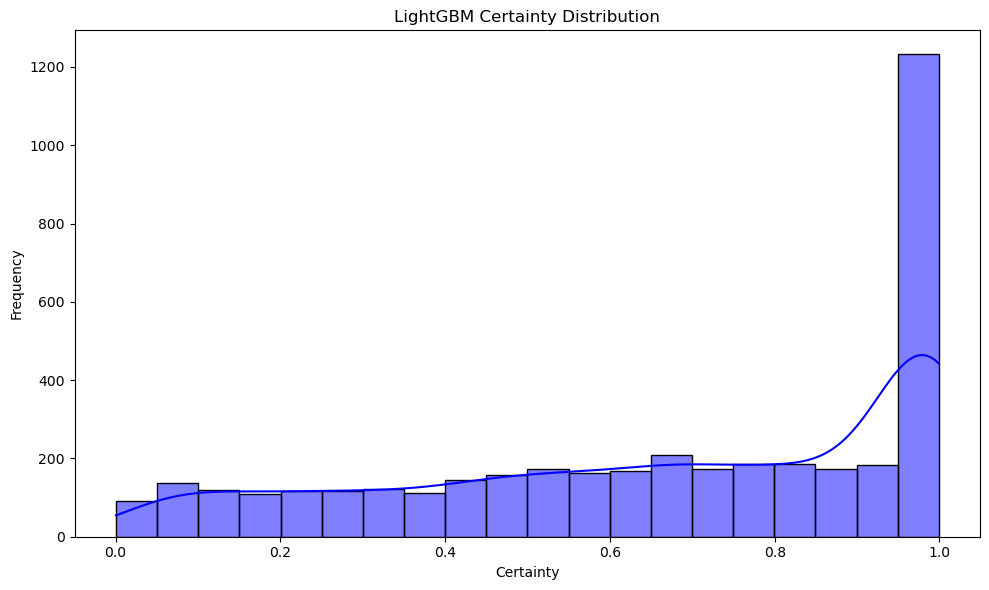

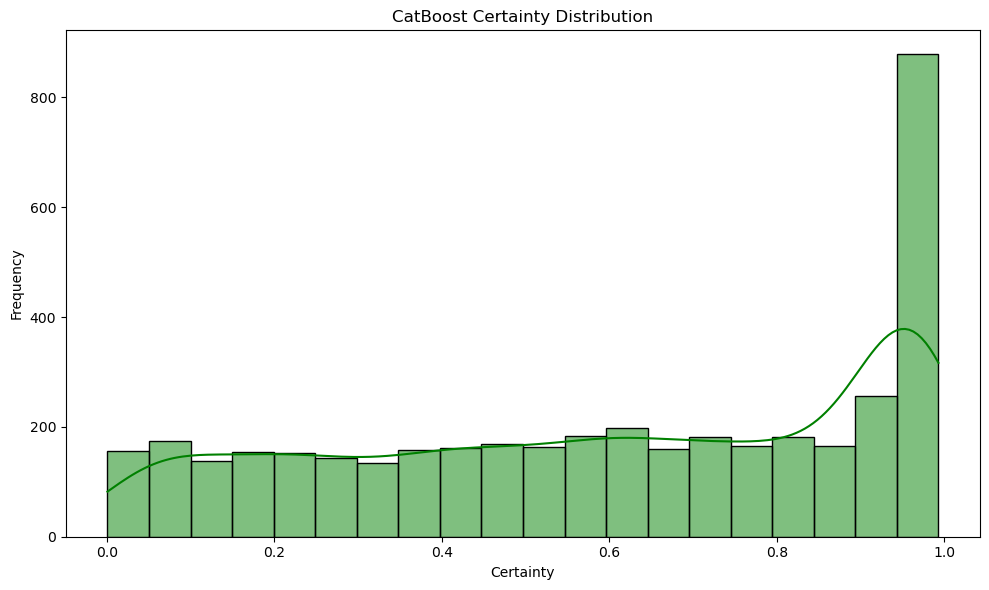

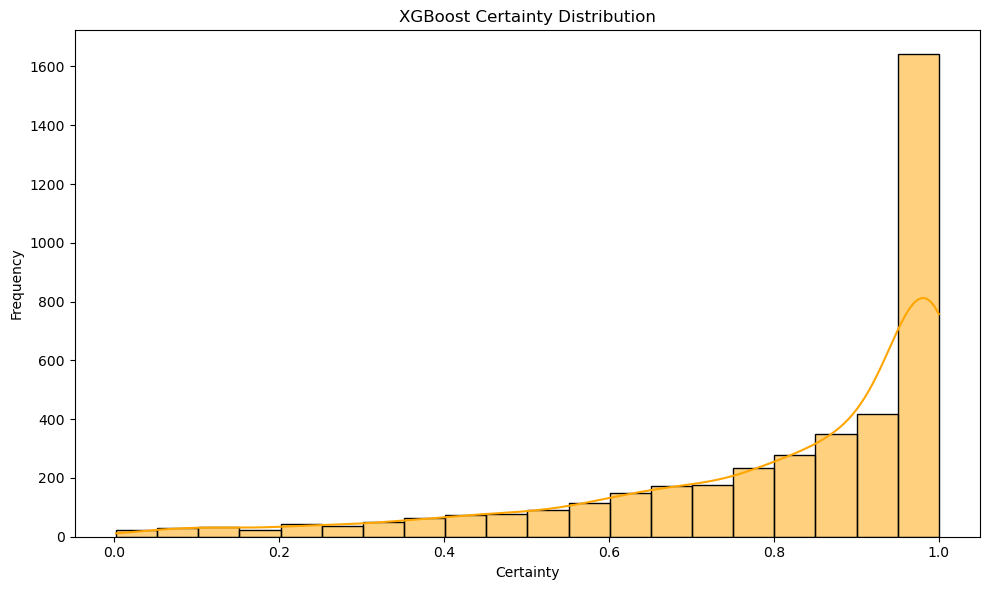

In [619]:

# Extract certainty data for each model
lgb_certainties = [entry['certainty'] for entry in portfolio_lgb.portfolio_history]
cb_certainties = [entry['certainty'] for entry in portfolio_cb.portfolio_history]
xgb_certainties = [entry['certainty'] for entry in portfolio_xgb.portfolio_history]

# LightGBM Certainty Plot
plt.figure(figsize=(10, 6))
sns.histplot(lgb_certainties, bins=20, kde=True, color='blue')
plt.title('LightGBM Certainty Distribution')
plt.xlabel('Certainty')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

# CatBoost Certainty Plot
plt.figure(figsize=(10, 6))
sns.histplot(cb_certainties, bins=20, kde=True, color='green')
plt.title('CatBoost Certainty Distribution')
plt.xlabel('Certainty')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

# XGBoost Certainty Plot
plt.figure(figsize=(10, 6))
sns.histplot(xgb_certainties, bins=20, kde=True, color='orange')
plt.title('XGBoost Certainty Distribution')
plt.xlabel('Certainty')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

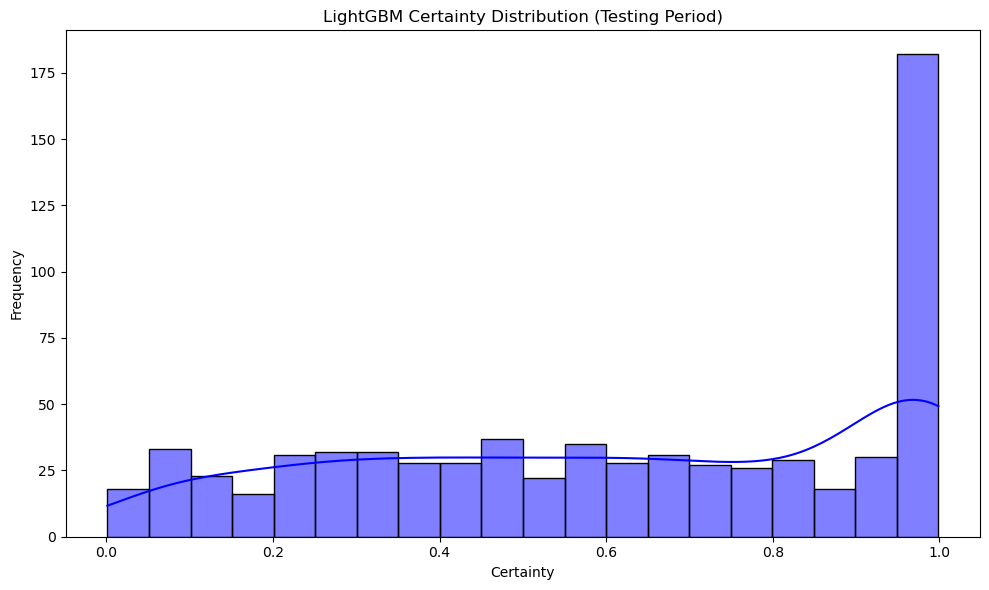

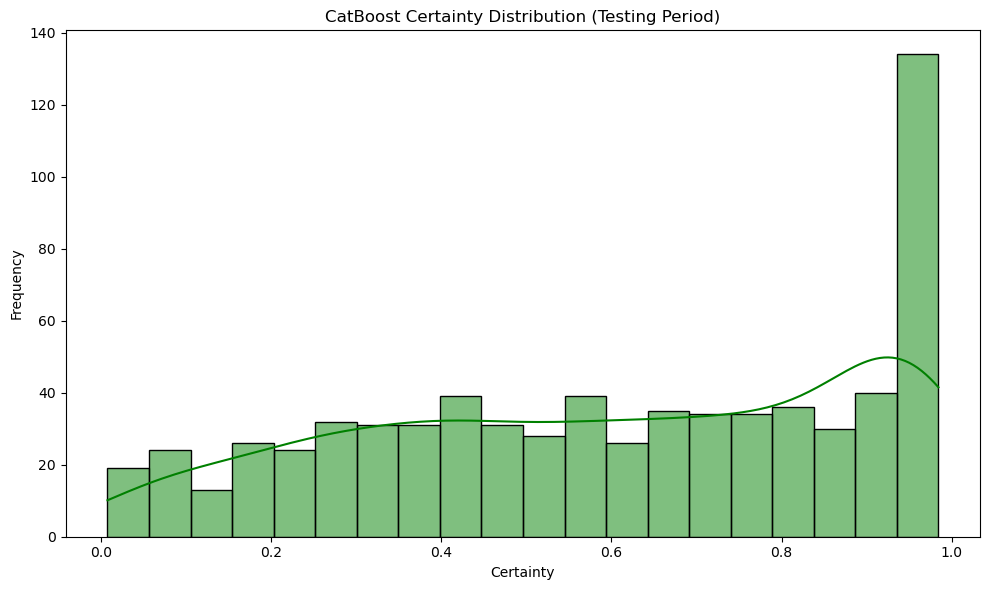

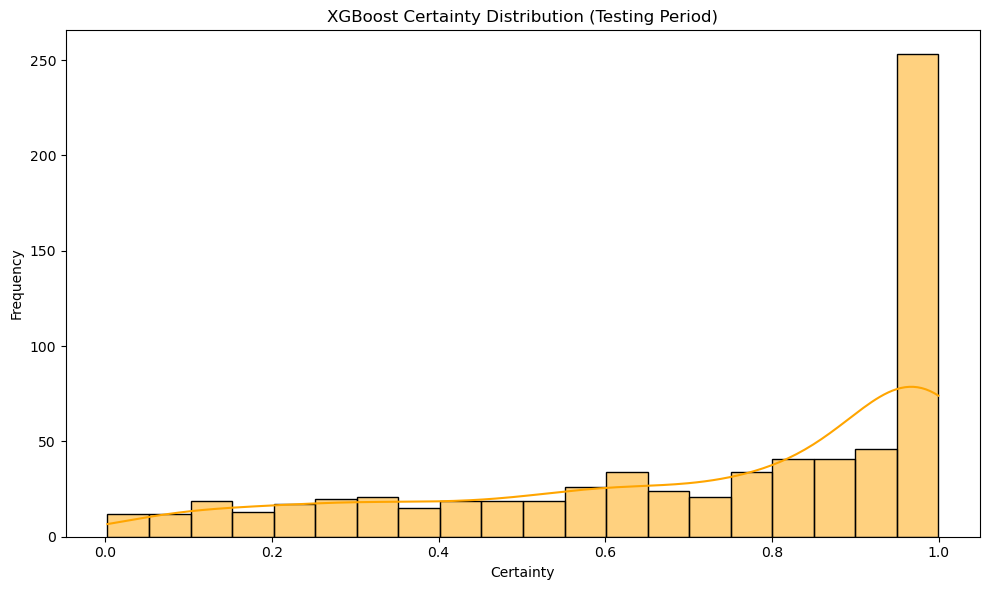

In [621]:
# Filter for testing period only
testing_period_data = full_dataset[full_dataset.index >= split_date]

# Extract certainty data for the testing period
lgb_certainties_test = testing_period_data['LightGBM_Certainty']
cb_certainties_test = testing_period_data['CatBoost_Certainty']
xgb_certainties_test = testing_period_data['XGBoost_Certainty']

# LightGBM Certainty Plot (Testing Period)
plt.figure(figsize=(10, 6))
sns.histplot(lgb_certainties_test, bins=20, kde=True, color='blue')
plt.title('LightGBM Certainty Distribution (Testing Period)')
plt.xlabel('Certainty')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

# CatBoost Certainty Plot (Testing Period)
plt.figure(figsize=(10, 6))
sns.histplot(cb_certainties_test, bins=20, kde=True, color='green')
plt.title('CatBoost Certainty Distribution (Testing Period)')
plt.xlabel('Certainty')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

# XGBoost Certainty Plot (Testing Period)
plt.figure(figsize=(10, 6))
sns.histplot(xgb_certainties_test, bins=20, kde=True, color='orange')
plt.title('XGBoost Certainty Distribution (Testing Period)')
plt.xlabel('Certainty')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

In [623]:
# Calculate Average Certainty for Full Dataset
lgb_avg_certainty_full = full_dataset['LightGBM_Certainty'].mean()
cb_avg_certainty_full = full_dataset['CatBoost_Certainty'].mean()
xgb_avg_certainty_full = full_dataset['XGBoost_Certainty'].mean()

# Calculate Average Certainty for Testing Dataset
testing_period_data = full_dataset[full_dataset.index >= split_date]
lgb_avg_certainty_test = testing_period_data['LightGBM_Certainty'].mean()
cb_avg_certainty_test = testing_period_data['CatBoost_Certainty'].mean()
xgb_avg_certainty_test = testing_period_data['XGBoost_Certainty'].mean()

# Print Average Certainties
print(f"LightGBM Average Certainty (Full Dataset): {lgb_avg_certainty_full:.4f}")
print(f"CatBoost Average Certainty (Full Dataset): {cb_avg_certainty_full:.4f}")
print(f"XGBoost Average Certainty (Full Dataset): {xgb_avg_certainty_full:.4f}")

print(f"LightGBM Average Certainty (Testing Dataset): {lgb_avg_certainty_test:.4f}")
print(f"CatBoost Average Certainty (Testing Dataset): {cb_avg_certainty_test:.4f}")
print(f"XGBoost Average Certainty (Testing Dataset): {xgb_avg_certainty_test:.4f}")

LightGBM Average Certainty (Full Dataset): 0.6670
CatBoost Average Certainty (Full Dataset): 0.5994
XGBoost Average Certainty (Full Dataset): 0.8136
LightGBM Average Certainty (Testing Dataset): 0.6125
CatBoost Average Certainty (Testing Dataset): 0.5993
XGBoost Average Certainty (Testing Dataset): 0.7245


In [625]:
class SHAPExplainer:
    def __init__(self, model, data, model_name):
        self.model = model
        self.data = data
        self.model_name = model_name
        self.explainer = shap.TreeExplainer(model)
        self.shap_values = self.explainer.shap_values(data)

    def summary_plot(self):
        """Generates a single SHAP summary plot for feature importance."""
        shap_values = self.shap_values[1] if isinstance(self.shap_values, list) else self.shap_values
        shap.summary_plot(shap_values, self.data, show=False)  # Prevent auto-plotting
        plt.xticks(rotation=90)
        plt.title(f'{self.model_name} SHAP Summary Plot')
        plt.tight_layout()
        plt.show()

    def feature_importance(self):
        """Generates a single SHAP feature importance plot."""
        shap_values = self.shap_values[1] if isinstance(self.shap_values, list) else self.shap_values
        shap.summary_plot(shap_values, self.data, plot_type="bar", show=False)  # Prevent auto-plotting
        plt.xticks(rotation=90)
        plt.title(f'{self.model_name} SHAP Feature Importance')
        plt.tight_layout(rect=[0, 0.1, 3, 1])
        plt.show()

    def force_plot_single(self, observation_index):
        """Generates a vertical SHAP force plot using Matplotlib."""
        shap.initjs()
        shap_values = self.shap_values[1] if isinstance(self.shap_values, list) else self.shap_values
        plt.figure(figsize=(12, 18))  # Increased figure size for better spacing
        
        # Create the SHAP force plot and rotate it vertically
        shap.force_plot(
            self.explainer.expected_value[1] if isinstance(self.explainer.expected_value, list) else self.explainer.expected_value,
            shap_values[observation_index],
            self.data.iloc[observation_index].index.tolist(),# Feature names only
            matplotlib=True
        )
     
    # Generate SHAP plots for all three models
shap_explainer_lgb = SHAPExplainer(lgb_model, full_dataset[feature_columns], 'LightGBM')
shap_explainer_cb = SHAPExplainer(cb_model, full_dataset[feature_columns], 'CatBoost')
shap_explainer_xgb = SHAPExplainer(xgb_model, full_dataset[feature_columns], 'XGBoost')




In [627]:
""" # Generate summary plots
shap_explainer_lgb.summary_plot()
shap_explainer_cb.summary_plot()
shap_explainer_xgb.summary_plot()

# Generate feature importance plots
shap_explainer_lgb.feature_importance()
shap_explainer_cb.feature_importance()
shap_explainer_xgb.feature_importance()

"""

' # Generate summary plots\nshap_explainer_lgb.summary_plot()\nshap_explainer_cb.summary_plot()\nshap_explainer_xgb.summary_plot()\n\n# Generate feature importance plots\nshap_explainer_lgb.feature_importance()\nshap_explainer_cb.feature_importance()\nshap_explainer_xgb.feature_importance()\n\n'

<Figure size 1200x1800 with 0 Axes>

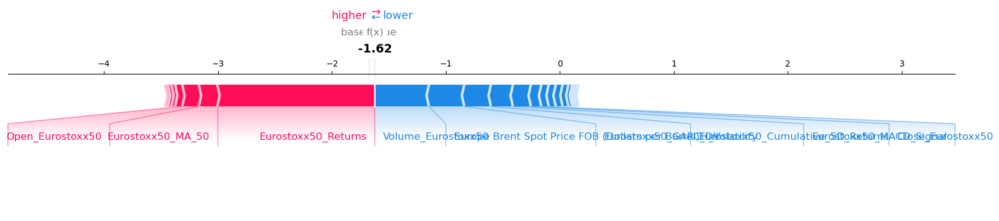

<Figure size 1200x1800 with 0 Axes>

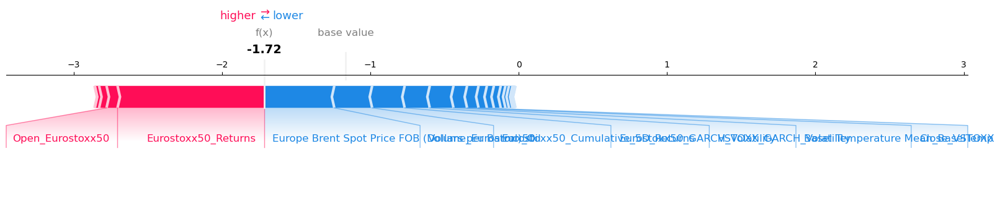

<Figure size 1200x1800 with 0 Axes>

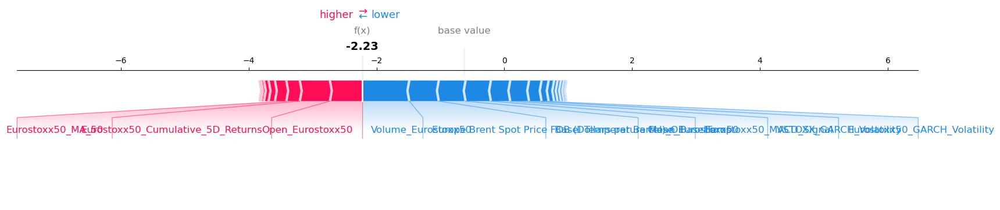

In [629]:
# Generate force plot for a single decision
shap_explainer_lgb.force_plot_single(2)
shap_explainer_cb.force_plot_single(2)
shap_explainer_xgb.force_plot_single(2)


In [631]:
class PDPExplainer:
    def __init__(self, model, data):
        """
        Initializes the PDP explainer for the given model and data.
        Parameters:
        - model: The trained model (e.g., LightGBM, CatBoost, XGBoost).
        - data: DataFrame with features used in the model.
        """
        self.model = model
        self.data = data
        self.default_features = [ "Open_Eurostoxx50", "VSTOXX_Close"]  # Set default features

    def compute_1d_pdp(self, feature, grid_points=20):
        """
        Computes the 1D partial dependence for a given feature.
        """
        X_temp = self.data.copy()
        grid_values = np.linspace(X_temp[feature].min(), X_temp[feature].max(), grid_points)
        pdp_values = []

        for val in grid_values:
            X_temp[feature] = val
            preds = self.model.predict(X_temp)
            pdp_values.append(np.mean(preds))

        return grid_values, pdp_values

    def plot_1d_pdp(self, grid_points=20):
        """
        Plots the 1D partial dependence plot for the default feature.
        """
        feature = self.default_features[0]
        grid_values, pdp_values = self.compute_1d_pdp(feature, grid_points)

        plt.figure(figsize=(10, 6))
        plt.plot(grid_values, pdp_values, color='blue', linewidth=2)
        plt.xlabel(feature)
        plt.ylabel('Partial Dependence')
        plt.title(f'1D Partial Dependence Plot for {feature}')
        plt.show()

    def compute_2d_pdp(self, feature1, feature2, grid_points=20):
        """
        Computes the 2D partial dependence for a pair of features.
        """
        grid1 = np.linspace(self.data[feature1].min(), self.data[feature1].max(), grid_points)
        grid2 = np.linspace(self.data[feature2].min(), self.data[feature2].max(), grid_points)

        pdp_values = np.zeros((grid_points, grid_points))

        for i, val1 in enumerate(grid1):
            for j, val2 in enumerate(grid2):
                X_temp = self.data.copy()
                X_temp[feature1] = val1
                X_temp[feature2] = val2
                preds = self.model.predict(X_temp)
                pdp_values[i, j] = np.mean(preds)

        return grid1, grid2, pdp_values

    def plot_2d_pdp(self, grid_points=20):
        """
        Plots the 2D partial dependence plot for the default features.
        """
        feature1, feature2 = self.default_features[:2]
        grid1, grid2, pdp_values = self.compute_2d_pdp(feature1, feature2, grid_points)

        plt.figure(figsize=(10, 8))
        plt.contourf(grid1, grid2, pdp_values.T, cmap='viridis')
        plt.colorbar(label="Predicted Value")
        plt.xlabel(feature1)
        plt.ylabel(feature2)
        plt.title(f'2D Partial Dependence Plot for {feature1} and {feature2}')
        plt.show()

    def plot_3d_pdp(self, grid_points=20, elev=30, azim=320):
        """
        Plots a 3D surface plot for the 2D partial dependence plot.
        """
        feature1, feature2 = self.default_features[:2]
        grid1, grid2, pdp_values = self.compute_2d_pdp(feature1, feature2, grid_points)

        X, Y = np.meshgrid(grid1, grid2)
        Z = pdp_values.T

        fig = plt.figure(figsize=(12, 10))
        ax = fig.add_subplot(111, projection='3d')
        surf = ax.plot_surface(X, Y, Z, cmap='viridis', edgecolor='k', alpha=0.7)
        fig.colorbar(surf, ax=ax, label="Predicted Value")

        ax.set_xlabel(feature1)
        ax.set_ylabel(feature2)
        ax.set_zlabel('Partial Dependence')
        ax.set_title(f'3D Partial Dependence Plot for {feature1} and {feature2}')

        ax.view_init(elev=elev, azim=azim)
        plt.show()

    def plot_all_pdp(self, grid_points=20):
        """Plots 1D, 2D, and 3D PDP for the default features."""
        self.plot_1d_pdp(grid_points)
        self.plot_2d_pdp(grid_points)
        self.plot_3d_pdp(grid_points)

    def set_features(self, feature1, feature2):
        """Set default features for the PDP plots."""
        self.default_features = [feature1, feature2]
        print(f"Default features set to: {feature1}, {feature2}")



In [633]:
# Assuming you have a trained model and a DataFrame with feature data
pdp_explainer = PDPExplainer(model=lgb_model, data=full_dataset[feature_columns])

In [635]:
# Set the features for visualization (example: 'Open_Eurostoxx50' and 'VSTOXX_Close')
pdp_explainer.set_features('Open_Eurostoxx50', 'Close_VSTOXX')

Default features set to: Open_Eurostoxx50, Close_VSTOXX


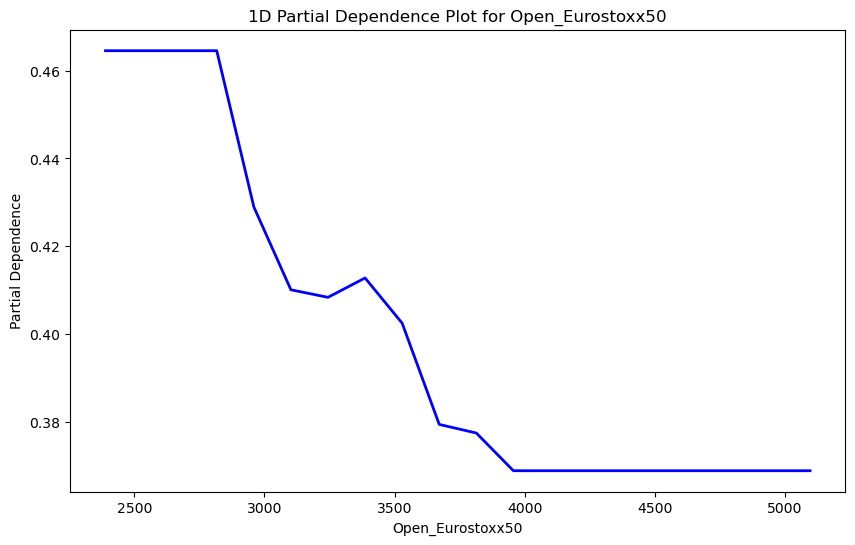

In [637]:
pdp_explainer.plot_1d_pdp()


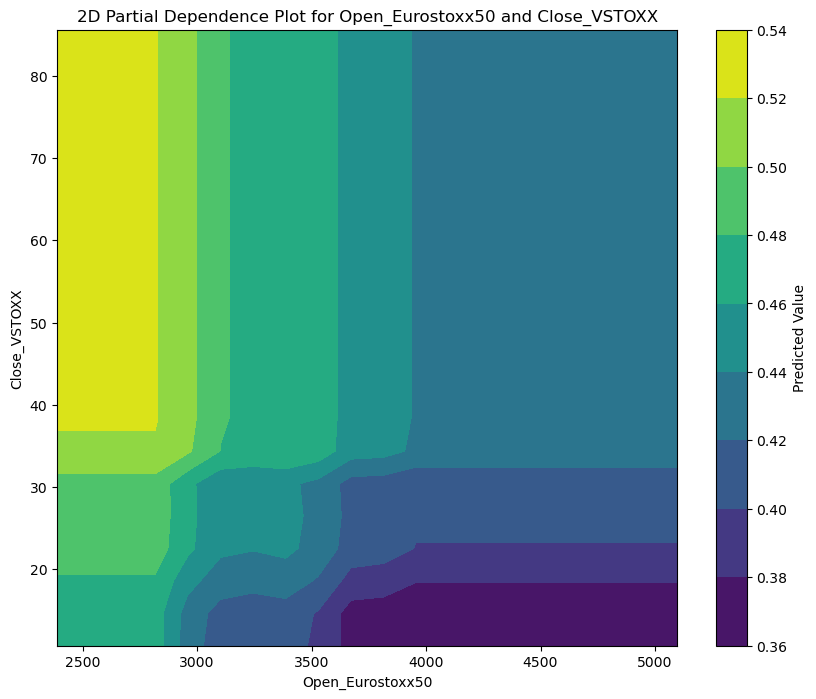

In [639]:
pdp_explainer.plot_2d_pdp()


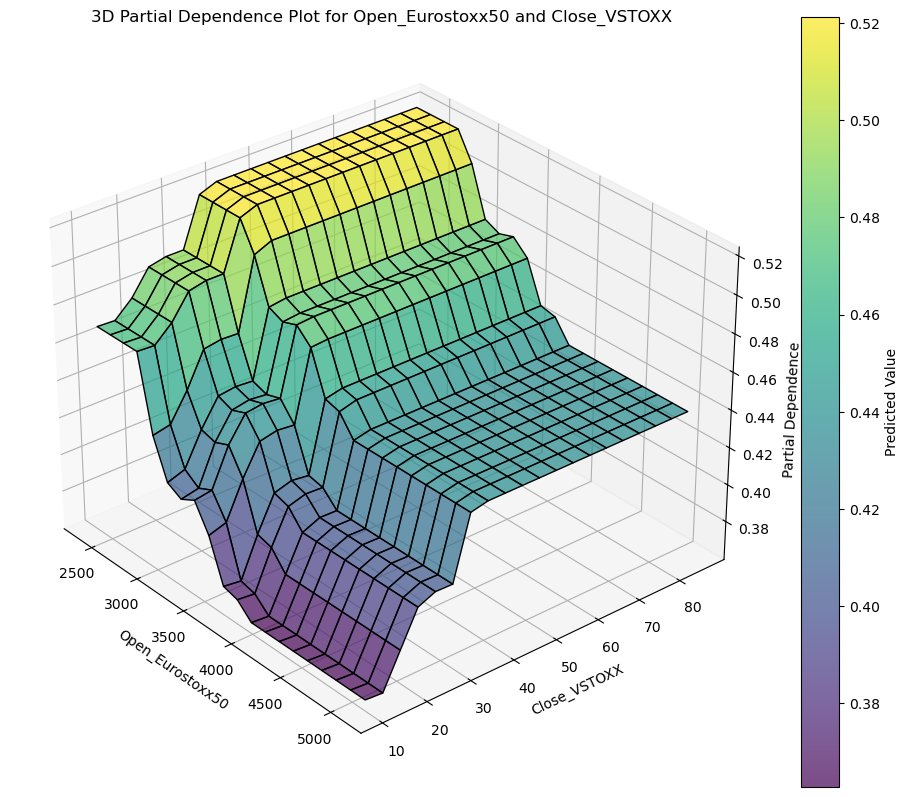

In [640]:
pdp_explainer.plot_3d_pdp()


In [641]:
class ICEExplainer:
    def __init__(self, model, data):
        """
        Initializes the ICE explainer for the given model and data.
        Parameters:
        - model: The trained model (e.g., LightGBM, CatBoost, XGBoost).
        - data: DataFrame with features used in the model.
        """
        self.model = model
        self.data = data
        self.default_feature = 'feature1'  # Set default feature

    def compute_ice(self, feature, instance_index, grid_points=20):
        """
        Computes the ICE curve for a single instance and a feature.
        """
        X_temp = self.data.copy()
        instance = X_temp.iloc[instance_index].copy()
        grid_values = np.linspace(X_temp[feature].min(), X_temp[feature].max(), grid_points)
        ice_values = []

        for val in grid_values:
            instance[feature] = val
            preds = self.model.predict([instance])
            ice_values.append(preds[0])

        return grid_values, ice_values

    def plot_ice(self, feature, instance_index, grid_points=20):
        """
        Plots the ICE curve for a single observation and a feature.
        """
        grid_values, ice_values = self.compute_ice(feature, instance_index, grid_points)

        plt.figure(figsize=(10, 6))
        plt.plot(grid_values, ice_values, color='blue', linewidth=2)
        plt.xlabel(feature)
        plt.ylabel('Prediction')
        plt.title(f'ICE Plot for {feature} (Instance {instance_index})')
        plt.show()

    def plot_average_ice(self, feature, grid_points=20, num_instances=50):
        """
        Plots the average ICE curve for multiple instances and a feature.
        """
        X_temp = self.data.copy()
        grid_values = np.linspace(X_temp[feature].min(), X_temp[feature].max(), grid_points)
        all_ice_values = np.zeros((num_instances, grid_points))

        for idx in range(num_instances):
            _, ice_values = self.compute_ice(feature, idx, grid_points)
            all_ice_values[idx, :] = ice_values

        avg_ice = all_ice_values.mean(axis=0)

        # Plotting all ICE curves with average curve highlighted
        plt.figure(figsize=(10, 6))
        for ice_curve in all_ice_values:
            plt.plot(grid_values, ice_curve, alpha=0.2, color='blue')
        plt.plot(grid_values, avg_ice, color='red', linewidth=2, label="Average ICE")
        plt.xlabel(feature)
        plt.ylabel('Prediction')
        plt.title(f'Average ICE Plot for {feature}')
        plt.legend()
        plt.show()

    def set_feature(self, feature):
        """Set the default feature for the ICE plots."""
        self.default_feature = feature
        print(f"Default feature set to: {feature}")


In [642]:
ice_explainer = ICEExplainer(model=lgb_model, data=full_dataset[feature_columns])



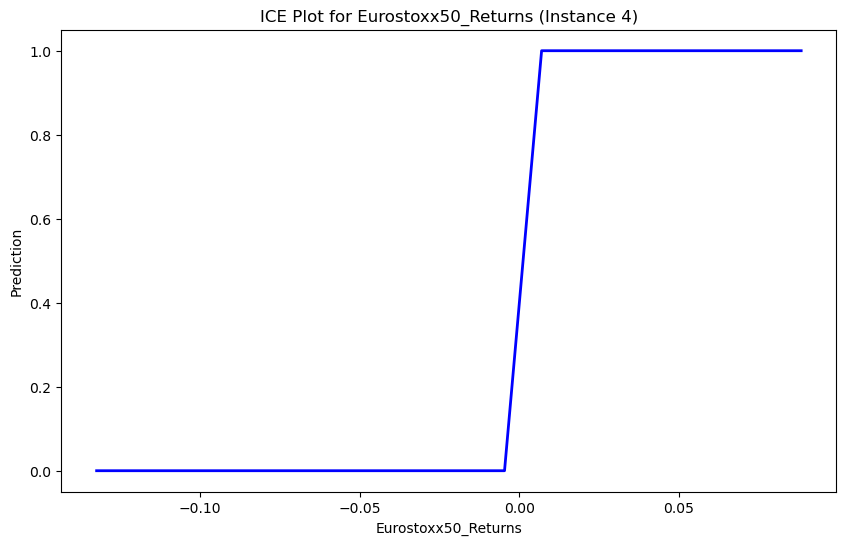

In [643]:
ice_explainer.plot_ice('Eurostoxx50_Returns', instance_index=4)  # For the first data point

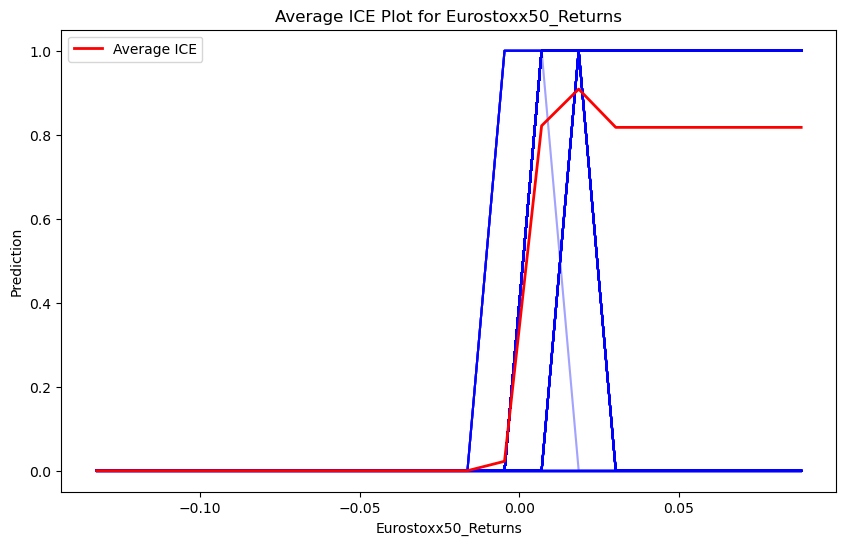

In [645]:
# Plot average ICE curve along with individual curves
ice_explainer.plot_average_ice('Eurostoxx50_Returns',num_instances=800)  


In [646]:
from lime.lime_tabular import LimeTabularExplainer
import matplotlib.pyplot as plt
from sklearn.utils import shuffle

class LIMEExplainer:
    def __init__(self, model, data):
        """
        Initializes the LIME explainer for the given model and data.
        Parameters:
        - model: The trained model (e.g., LightGBM, CatBoost, XGBoost).
        - data: DataFrame with features used in the model.
        """
        self.model = model
        self.data = data
        self.feature_names = data.columns.tolist()
        self.explainer = LimeTabularExplainer(
            training_data=data.values,
            feature_names=self.feature_names,
            mode='regression'
        )

    def explain_instance(self, instance_index):
        """
        Generates a LIME explanation for a single instance.
        Parameters:
        - instance_index: Index of the instance to explain.
        """
        instance = self.data.iloc[instance_index].values
        explanation = self.explainer.explain_instance(
            instance,
            self.model.predict,
            num_features=len(self.feature_names)
        )
        explanation.show_in_notebook(show_table=True)

    def plot_feature_importance(self, instance_index):
        """
        Plots the feature importance explanation from LIME for a single instance.
        """
        instance = self.data.iloc[instance_index].values
        explanation = self.explainer.explain_instance(
            instance,
            self.model.predict,
            num_features=len(self.feature_names)
        )

        # Visualize the feature importance
        plt.figure(figsize=(10, 6))
        explanation.as_pyplot_figure()
        plt.title(f'LIME Feature Importance for Instance {instance_index}')
        plt.tight_layout()
        plt.show()
        


In [647]:
# Change to a different instance for explanation
#lime_explainer.explain_instance(instance_index=5)
#lime_explainer.plot_feature_importance(instance_index=5)


In [648]:

# Explain an instance
lime_explainer.explain_instance(instance_index=0)

# Plot feature importance
lime_explainer.plot_feature_importance(instance_index=0)


NameError: name 'lime_explainer' is not defined

In [740]:
from anchor import anchor_tabular
from docx import Document

class AnchorExplainer:
    def __init__(self, model, data):
        """
        Initializes the Anchor explainer for the given model and data.
        Parameters:
        - model: The trained model (e.g., LightGBM, CatBoost, XGBoost).
        - data: DataFrame with features used in the model.
        """
        self.model = model
        self.data = data
        self.feature_names = data.columns.tolist()
        self.explainer = anchor_tabular.AnchorTabularExplainer(
            class_names=["Negative", "Positive"],
            feature_names=self.feature_names,
            train_data=data.values
        )

    def explain_instance(self, instance_index):
        """
        Generates an Anchor explanation for a single instance.
        """
        instance = self.data.iloc[instance_index].values
        explanation = self.explainer.explain_instance(
            instance,
            self.model.predict
        )
        explanation.show_in_notebook()

    def plot_feature_importance(self, instance_index):
        """
        Plots the feature importance explanation from Anchor for a single instance.
        """
        instance = self.data.iloc[instance_index].values
        explanation = self.explainer.explain_instance(
            instance,
            self.model.predict
        )

        print("Anchor Explanation:")
        print(explanation.names())
        print(explanation.precision())

    def export_text_explanation(self, instance_index):
        """
        Exports the textual explanation for a single instance to a file.
        """
        instance = self.data.iloc[instance_index].values
        explanation = self.explainer.explain_instance(
            instance,
            self.model.predict
        )
        with open(f"Anchor_Explanation_Instance_{instance_index}.txt", "w") as file:
            file.write(f"Explanation: {explanation.names()}\n")
            file.write(f"Precision: {explanation.precision()}\n")
        print(f"Text explanation saved as 'Anchor_Explanation_Instance_{instance_index}.txt'")

    def export_word_explanation(self, instance_index):
        """
        Exports the textual explanation for a single instance as a Word document.
        """
        instance = self.data.iloc[instance_index].values
        explanation = self.explainer.explain_instance(
            instance,
            self.model.predict
        )

        doc = Document()
        doc.add_heading(f'Anchor Explanation for Instance {instance_index}', level=1)
        doc.add_paragraph(f"Explanation: {', '.join(explanation.names())}")
        doc.add_paragraph(f"Precision: {explanation.precision()}")
        doc.save(f"Anchor_Explanation_Instance_{instance_index}.docx")
        print(f"Word explanation saved as 'Anchor_Explanation_Instance_{instance_index}.docx'")


In [742]:
# Initialize the AnchorExplainer with your trained model and dataset
anchor_explainer = AnchorExplainer(model=lgb_model, data=full_dataset[feature_columns])


In [752]:
# Generate an Anchor explanation for the first instance in the dataset
anchor_explainer.explain_instance(instance_index=6)
# Display feature importance and precision for the same instance
anchor_explainer.plot_feature_importance(instance_index=6)


Anchor Explanation:
['Eurostoxx50_Returns > -0.01', 'VSTOXX_MACD > -0.15', 'Europe Brent Spot Price FOB (Dollars per Barrel)_Oil > 83.43', 'Close_Gold > 1252.70', '0.83 < Eurostoxx50_GARCH_Volatility <= 0.99', '-0.30 < Average close_EURIBOR <= 0.24', '15.33 < Close_VSTOXX <= 22.99', '1253.00 < Open_Gold <= 1838.20', 'VSTOXX_RSI > 48.58', '-0.14 < VSTOXX_MACD_Signal <= 0.38', '18.78 < VSTOXX_MA_50 <= 23.52', '12.60 < Basel Temperature Mean_BaselTemp <= 18.39', '0.00 < Eurostoxx50_Cumulative_5D_Returns <= 0.02', 'Eurostoxx50_RSI > 52.47', 'Open_Eurostoxx50 <= 3219.19', 'VSTOXX_GARCH_Volatility > 6.46', 'Volume_Eurostoxx50 > 29117700.00', 'Close_Eurostoxx50 <= 3974.35', 'Eurostoxx50_MA_50 <= 3481.99', 'Eurostoxx50_MACD > 31.24', 'Eurostoxx50_MACD_Signal > 28.96']
0.8018518518518518


In [ ]:
# Export the Anchor explanation as a Word document
anchor_explainer.export_word_explanation(instance_index=4)


In [663]:
class HyperparameterTuner:
    def __init__(self, X_train, y_train):
        """
        Initializes the Hyperparameter Tuner for LightGBM, CatBoost, and XGBoost with L1 and L2 regularization.
        Parameters:
        - X_train: Training features.
        - y_train: Training target variable.
        """
        self.X_train = X_train
        self.y_train = y_train

        # Initialize models with default parameters
        self.models = {
            "LightGBM": lgb.LGBMClassifier(verbose=-1, verbosity=-1,device='gpu'),
            "CatBoost": cb.CatBoostClassifier(verbose=0,task_type='GPU'),
            "XGBoost": xgb.XGBClassifier(tree_method='gpu_hist', predictor='gpu_predictor')
        }

        # Define hyperparameter grids for each model including L1 and L2 regularization
        self.param_grids = {
            "LightGBM": {
                'n_estimators': [ 400, 600],
                'learning_rate': [0.01, 0.03, 0.06],
                'num_leaves': [10, 25, 31],
                'reg_alpha': [ 0.1, 0.4, 0.6],
                'reg_lambda': [ 0.1, 0.4, 0.6]
            },
            "CatBoost": {
                'iterations': [ 200, 300],
                'learning_rate': [0.01, 0.03, 0.06],
                'depth': [4, 6, 8],
                'l2_leaf_reg': [3, 5, 10]
            },
            "XGBoost": {
                'n_estimators': [  400, 600],
                'learning_rate': [0.01, 0.03, 0.06],
                'max_depth': [4, 6, 8, 10],
                'reg_alpha': [ 0.1, 0.4, 0.6],
                'reg_lambda': [ 0.1, 0.4, 0.6]
            }
        }
        
        self.best_models = {}

    def tune_models(self):
        """
        Tunes all models using GridSearchCV and stores the best models.
        """
        for model_name, model in self.models.items():
            print(f"Tuning {model_name}...")
            grid_search = GridSearchCV(
                model,
                self.param_grids[model_name],
                scoring="roc_auc",
                cv=3,
                verbose=0
            )
            grid_search.fit(self.X_train, self.y_train)
            self.best_models[model_name] = grid_search.best_estimator_
            print(f"Best Parameters for {model_name}: {grid_search.best_params_}")
            print(f"Best Score: {grid_search.best_score_:.4f}")

    def get_best_model(self, model_name):
        """
        Returns the best tuned model for the specified algorithm.
        """
        return self.best_models.get(model_name, None)

In [665]:
# Initialize the tuner with training data
tuner = HyperparameterTuner(X_train, y_train)

# Perform hyperparameter tuning
tuner.tune_models()

# Retrieve the best LightGBM model
best_lgb_model = tuner.get_best_model("LightGBM")

# Retrieve the best CatBoost model
best_cb_model = tuner.get_best_model("CatBoost")

# Retrieve the best XGBoost model
best_xgb_model = tuner.get_best_model("XGBoost")


Tuning LightGBM...
Best Parameters for LightGBM: {'learning_rate': 0.01, 'n_estimators': 400, 'num_leaves': 10, 'reg_alpha': 0.6, 'reg_lambda': 0.6}
Best Score: 0.8245
Tuning CatBoost...
Best Parameters for CatBoost: {'depth': 6, 'iterations': 200, 'l2_leaf_reg': 10, 'learning_rate': 0.03}
Best Score: 0.8245
Tuning XGBoost...
Best Parameters for XGBoost: {'learning_rate': 0.01, 'max_depth': 4, 'n_estimators': 400, 'reg_alpha': 0.6, 'reg_lambda': 0.4}
Best Score: 0.8231


In [668]:
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score
class PerformanceEvaluator:
    def __init__(self, models, X_test, y_test):
        """
        Initializes the performance evaluator for comparing pre-tuned and post-tuned models.
        Parameters:
        - models: A dictionary containing pre-tuned and post-tuned models.
        - X_test: Test features.
        - y_test: Test target variable.
        """
        self.models = models
        self.X_test = X_test
        self.y_test = y_test

    def evaluate_models(self):
        """
        Evaluates all models and prints the performance metrics.
        """
        results = {}

        for model_name, model in self.models.items():
            y_pred = model.predict(self.X_test)
            y_prob = model.predict_proba(self.X_test)[:, 1] if hasattr(model, 'predict_proba') else None

            accuracy = accuracy_score(self.y_test, y_pred)
            f1 = f1_score(self.y_test, y_pred)
            roc_auc = roc_auc_score(self.y_test, y_prob) if y_prob is not None else 'N/A'

            results[model_name] = {
                "Accuracy": accuracy,
                "F1 Score": f1,
                "ROC AUC": roc_auc
            }

            print(f"\n{model_name} Performance:")
            print(f"Accuracy: {accuracy:.4f}")
            print(f"F1 Score: {f1:.4f}")
            print(f"ROC AUC: {roc_auc:.4f}" if y_prob is not None else "ROC AUC: Not Available")

        return results

    def compare_models(self):
        """
        Compare the models based on performance metrics.
        """
        results = self.evaluate_models()
        print("\nSummary of Model Performance:")
        for model, metrics in results.items():
            print(f"\n{model}:")
            for metric, value in metrics.items():
                print(f"{metric}: {value:.4f}")


In [670]:
best_models = {
    "LightGBM": best_lgb_model,
    "CatBoost": best_cb_model,
    "XGBoost": best_xgb_model
}

# Initialize the PerformanceEvaluator with test data
evaluator = PerformanceEvaluator(models=best_models, X_test=X_test, y_test=y_test)

# Run the comparison
evaluator.compare_models()


LightGBM Performance:
Accuracy: 0.7280
F1 Score: 0.6991
ROC AUC: 0.7945

CatBoost Performance:
Accuracy: 0.7252
F1 Score: 0.6921
ROC AUC: 0.7862

XGBoost Performance:
Accuracy: 0.7252
F1 Score: 0.6950
ROC AUC: 0.7950

Summary of Model Performance:

LightGBM:
Accuracy: 0.7280
F1 Score: 0.6991
ROC AUC: 0.7945

CatBoost:
Accuracy: 0.7252
F1 Score: 0.6921
ROC AUC: 0.7862

XGBoost:
Accuracy: 0.7252
F1 Score: 0.6950
ROC AUC: 0.7950


In [ ]:
# Simulate portfolio performance over the test dataset with tuned models
certainty_threshold = 0.1  # Adjusted threshold for certainty filtering

# Initialize portfolios for tuned models
portfolio_lgb_tuned = Portfolio(initial_cash=100000)
portfolio_cb_tuned = Portfolio(initial_cash=100000)
portfolio_xgb_tuned = Portfolio(initial_cash=100000)

# Generate predictions and certainty scores for tuned models
test_dataset['LightGBM_Prediction_Tuned'] = best_lgb_model.predict(test_dataset[feature_columns])
test_dataset['CatBoost_Prediction_Tuned'] = best_cb_model.predict(test_dataset[feature_columns])
test_dataset['XGBoost_Prediction_Tuned'] = best_xgb_model.predict(test_dataset[feature_columns])

# Certainty Calculation for Tuned Models
test_dataset['LightGBM_Certainty_Tuned'] = np.abs(best_lgb_model.predict_proba(test_dataset[feature_columns])[:, 1] - 0.5) * 2
test_dataset['CatBoost_Certainty_Tuned'] = np.abs(best_cb_model.predict_proba(test_dataset[feature_columns])[:, 1] - 0.5) * 2
test_dataset['XGBoost_Certainty_Tuned'] = np.abs(best_xgb_model.predict_proba(test_dataset[feature_columns])[:, 1] - 0.5) * 2

# Simulate trading for the tuned models
for index, row in test_dataset.iterrows():
    price = row['Open_Eurostoxx50']

    # LightGBM Portfolio
    portfolio_lgb_tuned.update_portfolio_value({'Eurostoxx50': price}, index, certainty=row['LightGBM_Certainty_Tuned'])
    if row['LightGBM_Prediction_Tuned'] == 1 and row['LightGBM_Certainty_Tuned'] >= certainty_threshold:
        portfolio_lgb_tuned.buy('Eurostoxx50', price, certainty=row['LightGBM_Certainty_Tuned'], date=index)
    elif row['LightGBM_Prediction_Tuned'] == 0 and row['LightGBM_Certainty_Tuned'] >= certainty_threshold:
        portfolio_lgb_tuned.sell('Eurostoxx50', price, certainty=row['LightGBM_Certainty_Tuned'], date=index)

    # CatBoost Portfolio
    portfolio_cb_tuned.update_portfolio_value({'Eurostoxx50': price}, index, certainty=row['CatBoost_Certainty_Tuned'])
    if row['CatBoost_Prediction_Tuned'] == 1 and row['CatBoost_Certainty_Tuned'] >= certainty_threshold:
        portfolio_cb_tuned.buy('Eurostoxx50', price, certainty=row['CatBoost_Certainty_Tuned'], date=index)
    elif row['CatBoost_Prediction_Tuned'] == 0 and row['CatBoost_Certainty_Tuned'] >= certainty_threshold:
        portfolio_cb_tuned.sell('Eurostoxx50', price, certainty=row['CatBoost_Certainty_Tuned'], date=index)

    # XGBoost Portfolio
    portfolio_xgb_tuned.update_portfolio_value({'Eurostoxx50': price}, index, certainty=row['XGBoost_Certainty_Tuned'])
    if row['XGBoost_Prediction_Tuned'] == 1 and row['XGBoost_Certainty_Tuned'] >= certainty_threshold:
        portfolio_xgb_tuned.buy('Eurostoxx50', price, certainty=row['XGBoost_Certainty_Tuned'], date=index)
    elif row['XGBoost_Prediction_Tuned'] == 0 and row['XGBoost_Certainty_Tuned'] >= certainty_threshold:
        portfolio_xgb_tuned.sell('Eurostoxx50', price, certainty=row['XGBoost_Certainty_Tuned'], date=index)



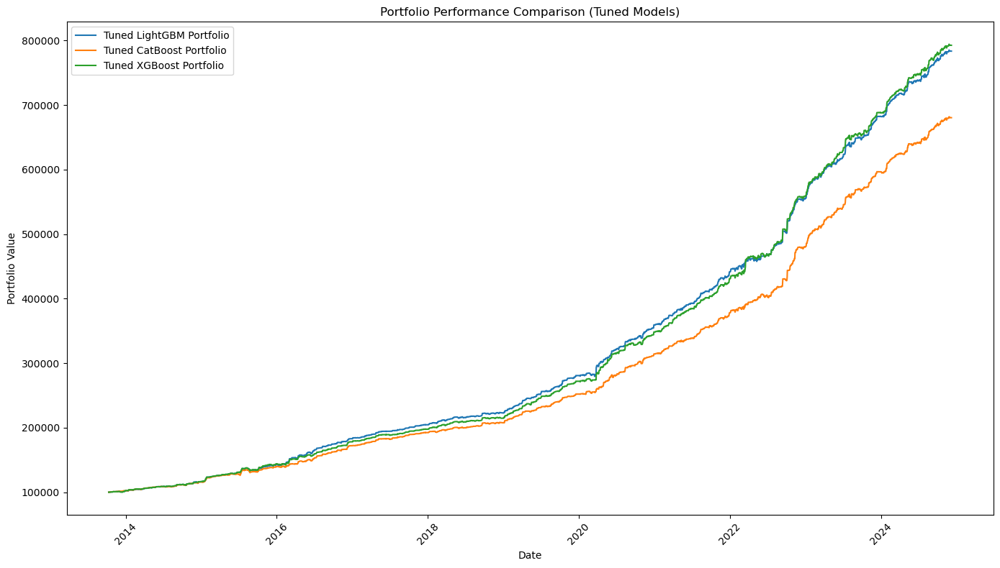

In [676]:
# Portfolio Comparison Plot
plt.figure(figsize=(14, 8))
plt.plot([entry['date'] for entry in portfolio_lgb_tuned.portfolio_history],
         [entry['total_value'] for entry in portfolio_lgb_tuned.portfolio_history], label='Tuned LightGBM Portfolio')
plt.plot([entry['date'] for entry in portfolio_cb_tuned.portfolio_history],
         [entry['total_value'] for entry in portfolio_cb_tuned.portfolio_history], label='Tuned CatBoost Portfolio')
plt.plot([entry['date'] for entry in portfolio_xgb_tuned.portfolio_history],
         [entry['total_value'] for entry in portfolio_xgb_tuned.portfolio_history], label='Tuned XGBoost Portfolio')
plt.title('Portfolio Performance Comparison (Tuned Models)')
plt.xlabel('Date')
plt.ylabel('Portfolio Value')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [ ]:
# Reset portfolios for full dataset simulation
portfolio_lgb_tuned = Portfolio(initial_cash=100000)
portfolio_cb_tuned = Portfolio(initial_cash=100000)
portfolio_xgb_tuned = Portfolio(initial_cash=100000)

# Define certainty threshold for trading decisions
certainty_threshold = 0.1

# Generate predictions and certainty scores for the full dataset using tuned models
full_dataset['LightGBM_Prediction_Tuned'] = best_lgb_model.predict(full_dataset[feature_columns])
full_dataset['CatBoost_Prediction_Tuned'] = best_cb_model.predict(full_dataset[feature_columns])
full_dataset['XGBoost_Prediction_Tuned'] = best_xgb_model.predict(full_dataset[feature_columns])

# Certainty Calculation for the full dataset
full_dataset['LightGBM_Certainty_Tuned'] = np.abs(best_lgb_model.predict_proba(full_dataset[feature_columns])[:, 1] - 0.5) * 2
full_dataset['CatBoost_Certainty_Tuned'] = np.abs(best_cb_model.predict_proba(full_dataset[feature_columns])[:, 1] - 0.5) * 2
full_dataset['XGBoost_Certainty_Tuned'] = np.abs(best_xgb_model.predict_proba(full_dataset[feature_columns])[:, 1] - 0.5) * 2

# Initialize Buy and Hold Strategy
initial_price = full_dataset.iloc[0]['Open_Eurostoxx50']
buy_and_hold_units = 100000 / initial_price

# Simulate the portfolio performance over the entire dataset
for index, row in full_dataset.iterrows():
    price = row['Open_Eurostoxx50']

    # LightGBM Portfolio
    portfolio_lgb_tuned.update_portfolio_value({'Eurostoxx50': price}, index, certainty=row['LightGBM_Certainty_Tuned'])
    if row['LightGBM_Prediction_Tuned'] == 1 and row['LightGBM_Certainty_Tuned'] >= certainty_threshold:
        portfolio_lgb_tuned.buy('Eurostoxx50', price, certainty=row['LightGBM_Certainty_Tuned'], date=index)
    elif row['LightGBM_Prediction_Tuned'] == 0 and row['LightGBM_Certainty_Tuned'] >= certainty_threshold:
        portfolio_lgb_tuned.sell('Eurostoxx50', price, certainty=row['LightGBM_Certainty_Tuned'], date=index)

    # CatBoost Portfolio
    portfolio_cb_tuned.update_portfolio_value({'Eurostoxx50': price}, index, certainty=row['CatBoost_Certainty_Tuned'])
    if row['CatBoost_Prediction_Tuned'] == 1 and row['CatBoost_Certainty_Tuned'] >= certainty_threshold:
        portfolio_cb_tuned.buy('Eurostoxx50', price, certainty=row['CatBoost_Certainty_Tuned'], date=index)
    elif row['CatBoost_Prediction_Tuned'] == 0 and row['CatBoost_Certainty_Tuned'] >= certainty_threshold:
        portfolio_cb_tuned.sell('Eurostoxx50', price, certainty=row['CatBoost_Certainty_Tuned'], date=index)

    # XGBoost Portfolio
    portfolio_xgb_tuned.update_portfolio_value({'Eurostoxx50': price}, index, certainty=row['XGBoost_Certainty_Tuned'])
    if row['XGBoost_Prediction_Tuned'] == 1 and row['XGBoost_Certainty_Tuned'] >= certainty_threshold:
        portfolio_xgb_tuned.buy('Eurostoxx50', price, certainty=row['XGBoost_Certainty_Tuned'], date=index)
    elif row['XGBoost_Prediction_Tuned'] == 0 and row['XGBoost_Certainty_Tuned'] >= certainty_threshold:
        portfolio_xgb_tuned.sell('Eurostoxx50', price, certainty=row['XGBoost_Certainty_Tuned'], date=index)

# Final portfolio values
lgb_final_value_tuned = portfolio_lgb_tuned.portfolio_history[-1]['total_value']
cb_final_value_tuned = portfolio_cb_tuned.portfolio_history[-1]['total_value']
xgb_final_value_tuned = portfolio_xgb_tuned.portfolio_history[-1]['total_value']
buy_and_hold_final_value = buy_and_hold_units * full_dataset.iloc[-1]['Open_Eurostoxx50']

# Calculate Return on Investment (ROI)
lgb_roi_tuned = ((lgb_final_value_tuned - 100000) / 100000) * 100
cb_roi_tuned = ((cb_final_value_tuned - 100000) / 100000) * 100
xgb_roi_tuned = ((xgb_final_value_tuned - 100000) / 100000) * 100
buy_and_hold_roi = ((buy_and_hold_final_value - 100000) / 100000) * 100





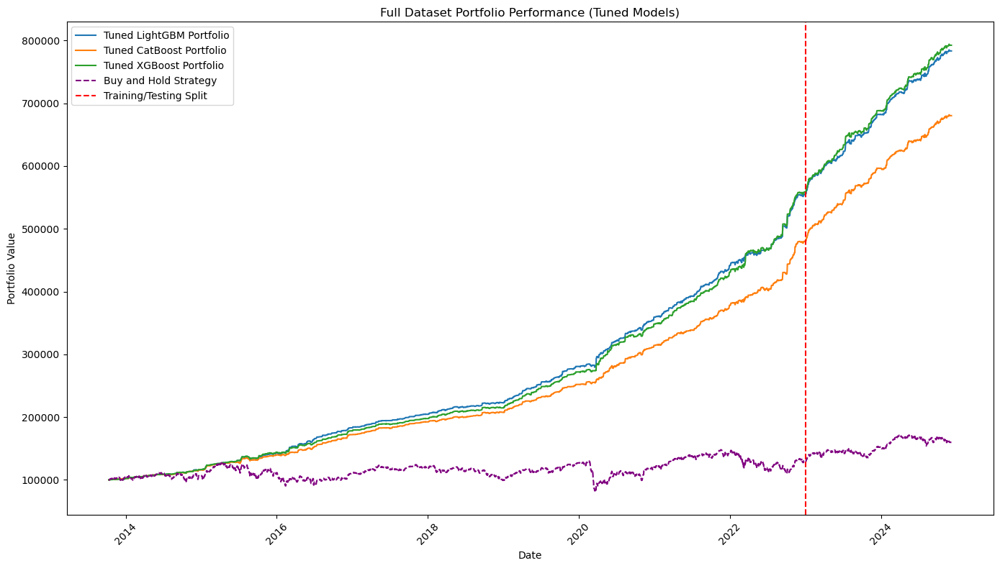

Tuned LightGBM Final Portfolio Value: $783447.16
Tuned CatBoost Final Portfolio Value: $680326.99
Tuned XGBoost Final Portfolio Value: $792502.62
Buy and Hold Final Portfolio Value: $159826.68
Tuned LightGBM ROI: 683.45%
Tuned CatBoost ROI: 580.33%
Tuned XGBoost ROI: 692.50%
Buy and Hold ROI: 59.83%


In [680]:
#  **Plotting Portfolio Performance (Full Dataset)**
plt.figure(figsize=(14, 8))
plt.plot([entry['date'] for entry in portfolio_lgb_tuned.portfolio_history],
         [entry['total_value'] for entry in portfolio_lgb_tuned.portfolio_history], label='Tuned LightGBM Portfolio')
plt.plot([entry['date'] for entry in portfolio_cb_tuned.portfolio_history],
         [entry['total_value'] for entry in portfolio_cb_tuned.portfolio_history], label='Tuned CatBoost Portfolio')
plt.plot([entry['date'] for entry in portfolio_xgb_tuned.portfolio_history],
         [entry['total_value'] for entry in portfolio_xgb_tuned.portfolio_history], label='Tuned XGBoost Portfolio')

# Buy and Hold Strategy
plt.plot(full_dataset.index, [buy_and_hold_units * price for price in full_dataset['Open_Eurostoxx50']], 
         label='Buy and Hold Strategy', linestyle='--', color='purple')

# Mark the training/testing split
plt.axvline(split_date, color='red', linestyle='--', label='Training/Testing Split')
plt.title('Full Dataset Portfolio Performance (Tuned Models)')
plt.xlabel('Date')
plt.ylabel('Portfolio Value')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Print Final Results
print(f"Tuned LightGBM Final Portfolio Value: ${lgb_final_value_tuned:.2f}")
print(f"Tuned CatBoost Final Portfolio Value: ${cb_final_value_tuned:.2f}")
print(f"Tuned XGBoost Final Portfolio Value: ${xgb_final_value_tuned:.2f}")
print(f"Buy and Hold Final Portfolio Value: ${buy_and_hold_final_value:.2f}")

print(f"Tuned LightGBM ROI: {lgb_roi_tuned:.2f}%")
print(f"Tuned CatBoost ROI: {cb_roi_tuned:.2f}%")
print(f"Tuned XGBoost ROI: {xgb_roi_tuned:.2f}%")
print(f"Buy and Hold ROI: {buy_and_hold_roi:.2f}%")

In [682]:
# Ensure portfolio history is not empty before checking dates
if portfolio_lgb.portfolio_history:
    all_dates = [entry['date'] for entry in portfolio_lgb.portfolio_history]
    print(f"Min Date in Portfolio: {min(all_dates)}, Max Date: {max(all_dates)}")
    print(f"Split Date: {split_date}")
else:
    print("Portfolio history is empty. Please verify the simulation ran correctly.")


Min Date in Portfolio: 2013-10-11 00:00:00, Max Date: 2024-12-06 00:00:00
Split Date: 2023-01-01 00:00:00


In [684]:
# Ensure split_date is a datetime object
if isinstance(split_date, str):
    split_date = datetime.strptime(split_date, '%Y-%m-%d')

# Check and print to validate dates in the portfolio
all_dates = [entry['date'] for entry in portfolio_lgb.portfolio_history]
print(f"Min Date in Portfolio: {min(all_dates)}, Max Date: {max(all_dates)}")
print(f"Split Date: {split_date}")

Min Date in Portfolio: 2013-10-11 00:00:00, Max Date: 2024-12-06 00:00:00
Split Date: 2023-01-01 00:00:00


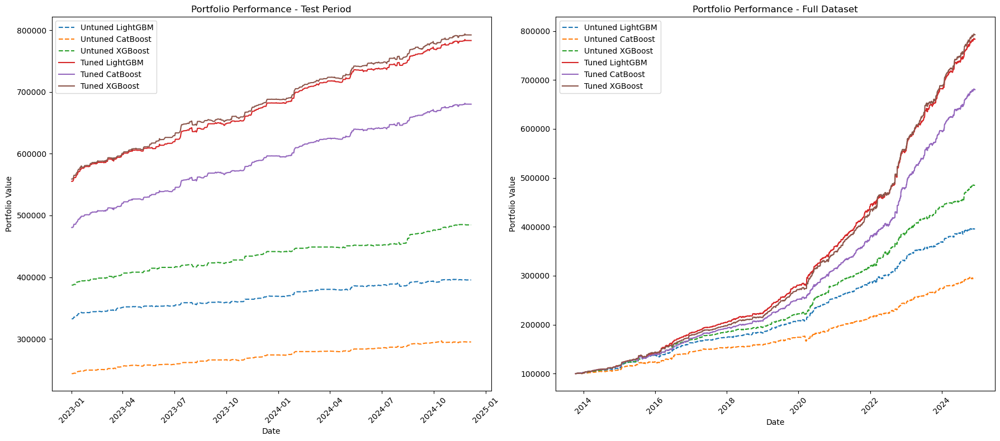

In [686]:
from datetime import datetime

# Ensure split_date is a datetime object
if isinstance(split_date, str):
    split_date = datetime.strptime(split_date, '%Y-%m-%d')

# Prepare data for test period and full dataset comparisons
test_period_lgb = [entry['total_value'] for entry in portfolio_lgb.portfolio_history if entry['date'] >= split_date]
test_period_cb = [entry['total_value'] for entry in portfolio_cb.portfolio_history if entry['date'] >= split_date]
test_period_xgb = [entry['total_value'] for entry in portfolio_xgb.portfolio_history if entry['date'] >= split_date]

test_period_lgb_tuned = [entry['total_value'] for entry in portfolio_lgb_tuned.portfolio_history if entry['date'] >= split_date]
test_period_cb_tuned = [entry['total_value'] for entry in portfolio_cb_tuned.portfolio_history if entry['date'] >= split_date]
test_period_xgb_tuned = [entry['total_value'] for entry in portfolio_xgb_tuned.portfolio_history if entry['date'] >= split_date]

test_period_dates = [entry['date'] for entry in portfolio_lgb.portfolio_history if entry['date'] >= split_date]

#  Figure with two subplots
fig, axs = plt.subplots(1, 2, figsize=(18, 8))

### **First Subplot: Test Period Comparison**
axs[0].plot(test_period_dates, test_period_lgb, label='Untuned LightGBM', linestyle='--')
axs[0].plot(test_period_dates, test_period_cb, label='Untuned CatBoost', linestyle='--')
axs[0].plot(test_period_dates, test_period_xgb, label='Untuned XGBoost', linestyle='--')

axs[0].plot(test_period_dates, test_period_lgb_tuned, label='Tuned LightGBM')
axs[0].plot(test_period_dates, test_period_cb_tuned, label='Tuned CatBoost')
axs[0].plot(test_period_dates, test_period_xgb_tuned, label='Tuned XGBoost')

axs[0].set_title('Portfolio Performance - Test Period')
axs[0].set_xlabel('Date')
axs[0].set_ylabel('Portfolio Value')
axs[0].legend()
axs[0].tick_params(axis='x', rotation=45)

### **Second Subplot: Full Dataset Comparison**
axs[1].plot([entry['date'] for entry in portfolio_lgb.portfolio_history],
            [entry['total_value'] for entry in portfolio_lgb.portfolio_history], label='Untuned LightGBM', linestyle='--')
axs[1].plot([entry['date'] for entry in portfolio_cb.portfolio_history],
            [entry['total_value'] for entry in portfolio_cb.portfolio_history], label='Untuned CatBoost', linestyle='--')
axs[1].plot([entry['date'] for entry in portfolio_xgb.portfolio_history],
            [entry['total_value'] for entry in portfolio_xgb.portfolio_history], label='Untuned XGBoost', linestyle='--')

axs[1].plot([entry['date'] for entry in portfolio_lgb_tuned.portfolio_history],
            [entry['total_value'] for entry in portfolio_lgb_tuned.portfolio_history], label='Tuned LightGBM')
axs[1].plot([entry['date'] for entry in portfolio_cb_tuned.portfolio_history],
            [entry['total_value'] for entry in portfolio_cb_tuned.portfolio_history], label='Tuned CatBoost')
axs[1].plot([entry['date'] for entry in portfolio_xgb_tuned.portfolio_history],
            [entry['total_value'] for entry in portfolio_xgb_tuned.portfolio_history], label='Tuned XGBoost')

axs[1].set_title('Portfolio Performance - Full Dataset')
axs[1].set_xlabel('Date')
axs[1].set_ylabel('Portfolio Value')
axs[1].legend()
axs[1].tick_params(axis='x', rotation=45)

# Final layout adjustments
plt.tight_layout()
plt.show()


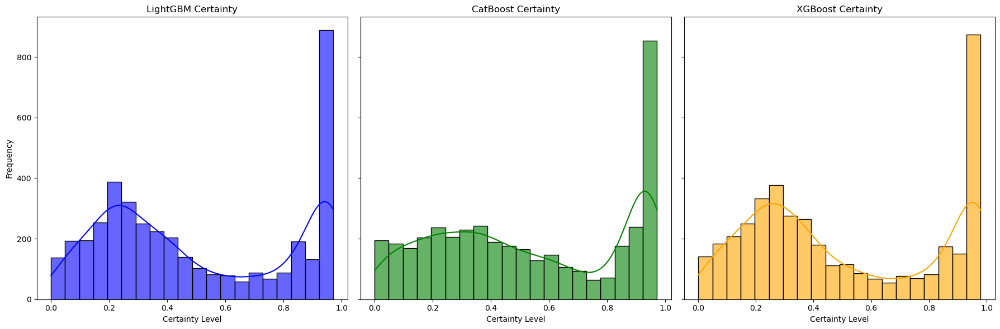

In [688]:


# Certainty Distributions for Tuned Models
lgb_certainties_tuned = [entry['certainty'] for entry in portfolio_lgb_tuned.portfolio_history]
cb_certainties_tuned = [entry['certainty'] for entry in portfolio_cb_tuned.portfolio_history]
xgb_certainties_tuned = [entry['certainty'] for entry in portfolio_xgb_tuned.portfolio_history]

# Create a figure with subplots for each certainty distribution
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)

# LightGBM Certainty Distribution
sns.histplot(lgb_certainties_tuned, bins=20, kde=True, color='blue', alpha=0.6, ax=axes[0])
axes[0].set_title('LightGBM Certainty')
axes[0].set_xlabel('Certainty Level')
axes[0].set_ylabel('Frequency')

# CatBoost Certainty Distribution
sns.histplot(cb_certainties_tuned, bins=20, kde=True, color='green', alpha=0.6, ax=axes[1])
axes[1].set_title('CatBoost Certainty')
axes[1].set_xlabel('Certainty Level')

# XGBoost Certainty Distribution
sns.histplot(xgb_certainties_tuned, bins=20, kde=True, color='orange', alpha=0.6, ax=axes[2])
axes[2].set_title('XGBoost Certainty')
axes[2].set_xlabel('Certainty Level')

plt.tight_layout()
plt.show()

In [754]:
# Calculate returns for the tuned models
lgb_returns_tuned = pd.Series([entry['total_value'] for entry in portfolio_lgb_tuned.portfolio_history]).pct_change().dropna()
cb_returns_tuned = pd.Series([entry['total_value'] for entry in portfolio_cb_tuned.portfolio_history]).pct_change().dropna()
xgb_returns_tuned = pd.Series([entry['total_value'] for entry in portfolio_xgb_tuned.portfolio_history]).pct_change().dropna()


# Calculate metrics for tuned models
lgb_sharpe_tuned = calculate_sharpe_ratio(lgb_returns_tuned, risk_free_rates)
cb_sharpe_tuned = calculate_sharpe_ratio(cb_returns_tuned, risk_free_rates)
xgb_sharpe_tuned = calculate_sharpe_ratio(xgb_returns_tuned, risk_free_rates)

lgb_volatility_tuned = calculate_volatility(lgb_returns_tuned)
cb_volatility_tuned = calculate_volatility(cb_returns_tuned)
xgb_volatility_tuned = calculate_volatility(xgb_returns_tuned)

lgb_drawdown_tuned = calculate_drawdown(lgb_returns_tuned).min()
cb_drawdown_tuned = calculate_drawdown(cb_returns_tuned).min()
xgb_drawdown_tuned = calculate_drawdown(xgb_returns_tuned).min()

# Compile performance metrics for tuned models
performance_metrics_tuned = pd.DataFrame({
    "Sharpe Ratio": [lgb_sharpe_tuned, cb_sharpe_tuned, xgb_sharpe_tuned],
    "Volatility": [lgb_volatility_tuned, cb_volatility_tuned, xgb_volatility_tuned],
    "Max Drawdown": [lgb_drawdown_tuned, cb_drawdown_tuned, xgb_drawdown_tuned]
}, index=['LightGBM Tuned', 'CatBoost Tuned', 'XGBoost Tuned'])

# Display the results
print(performance_metrics_tuned)


                Sharpe Ratio  Volatility  Max Drawdown
LightGBM Tuned     -6.230328    0.031840     -0.033529
CatBoost Tuned     -6.208673    0.029319     -0.034183
XGBoost Tuned      -6.280872    0.031796     -0.033481


In [692]:
# Ensure only the features used during model training are included
trained_features = X_train.columns.tolist()

# Initialize explainability tools for all three models
lime_explainer_lgb = LimeTabularExplainer(training_data=X_train.values, feature_names=X_train.columns.tolist(), mode='classification')
lime_explainer_cb = LimeTabularExplainer(training_data=X_train.values, feature_names=X_train.columns.tolist(), mode='classification')
lime_explainer_xgb = LimeTabularExplainer(training_data=X_train.values, feature_names=X_train.columns.tolist(), mode='classification')

shap_explainer_lgb = shap.TreeExplainer(best_lgb_model)
shap_explainer_cb = shap.TreeExplainer(best_cb_model)
shap_explainer_xgb = shap.TreeExplainer(best_xgb_model)

# Assuming you have a trained model and a DataFrame with feature data
pdp_explainer = PDPExplainer(model=best_lgb_model, data=full_dataset[feature_columns])

pdp_explainer_lgb = PDPExplainer(best_lgb_model, X_train[trained_features])
pdp_explainer_cb = PDPExplainer(best_cb_model, X_train[trained_features])
pdp_explainer_xgb = PDPExplainer(best_xgb_model, X_train[trained_features])

anchor_explainer_lgb = anchor_tabular.AnchorTabularExplainer(class_names=["Negative", "Positive"], feature_names=trained_features, train_data=X_train[trained_features].values)
anchor_explainer_cb = anchor_tabular.AnchorTabularExplainer(class_names=["Negative", "Positive"], feature_names=trained_features, train_data=X_train[trained_features].values)
anchor_explainer_xgb = anchor_tabular.AnchorTabularExplainer(class_names=["Negative", "Positive"], feature_names=trained_features, train_data=X_train[trained_features].values)



In [720]:
pdp_explainer.set_features('Open_Eurostoxx50', 'Close_VSTOXX')

Default features set to: Open_Eurostoxx50, Close_VSTOXX


In [710]:

# Run explainability for all models
# 2D LIME
print("Running LIME for all models...")
lime_explainer_lgb.explain_instance(X_test.iloc[0].values, best_lgb_model.predict_proba).show_in_notebook()
lime_explainer_cb.explain_instance(X_test.iloc[0].values, best_cb_model.predict_proba).show_in_notebook()
lime_explainer_xgb.explain_instance(X_test.iloc[0].values, best_xgb_model.predict_proba).show_in_notebook()


Running LIME for all models...


Running SHAP Summary Plots...


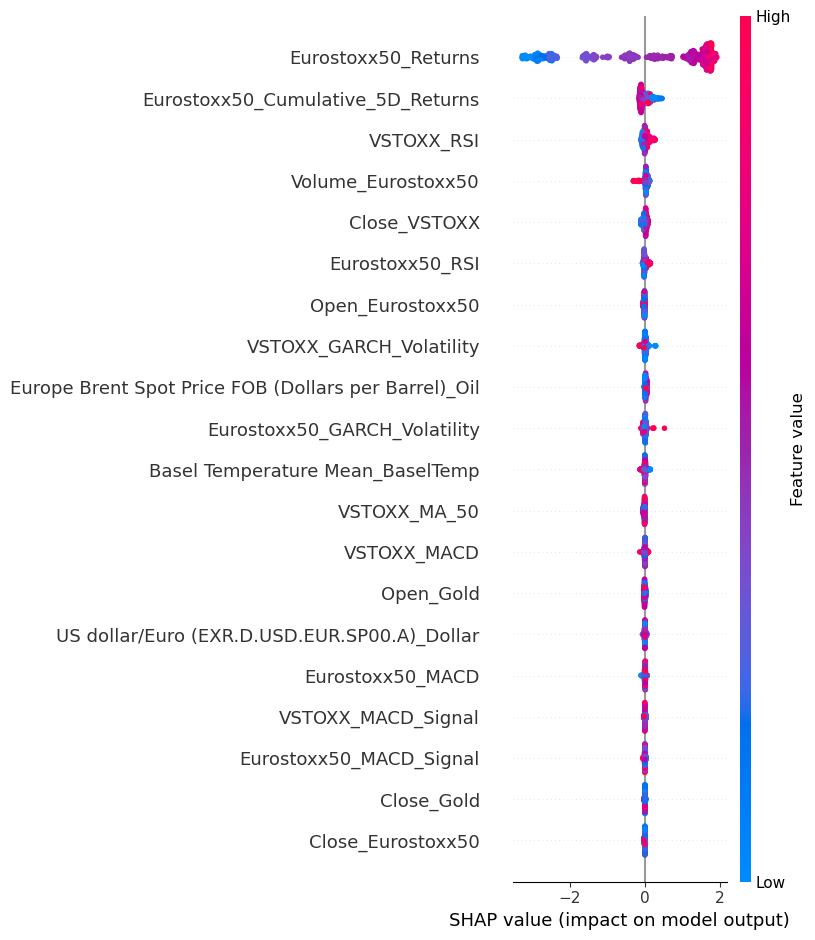

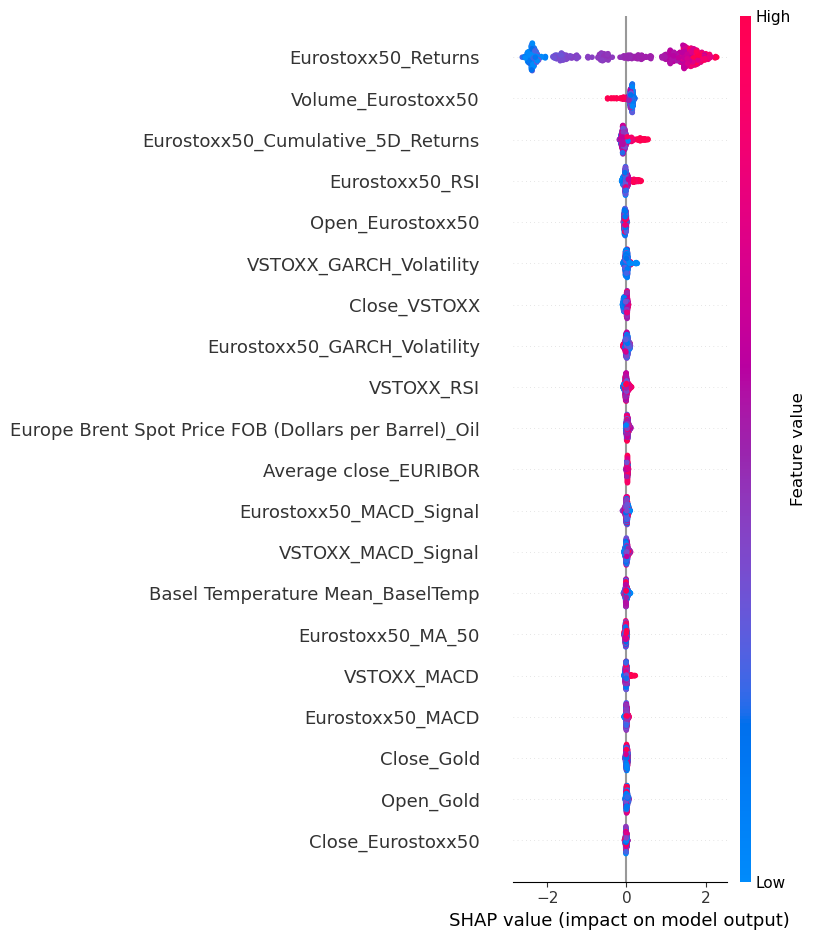

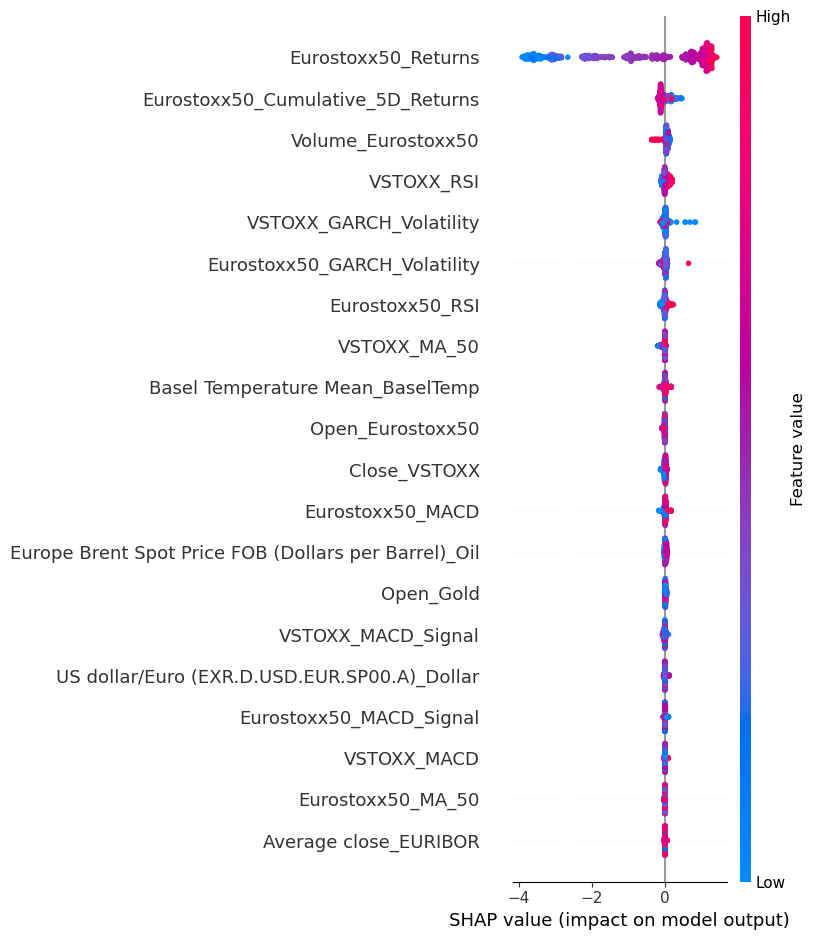

In [712]:

# SHAP Summary Plots
print("Running SHAP Summary Plots...")
shap.summary_plot(shap_explainer_lgb.shap_values(X_test), X_test)
shap.summary_plot(shap_explainer_cb.shap_values(X_test), X_test)
shap.summary_plot(shap_explainer_xgb.shap_values(X_test), X_test)


In [714]:
# Set the features for visualization (example: 'Open_Eurostoxx50' and 'VSTOXX_Close')
pdp_explainer.set_features('Open_Eurostoxx50', 'Close_VSTOXX')

Default features set to: Open_Eurostoxx50, Close_VSTOXX


Running PDP Plots...


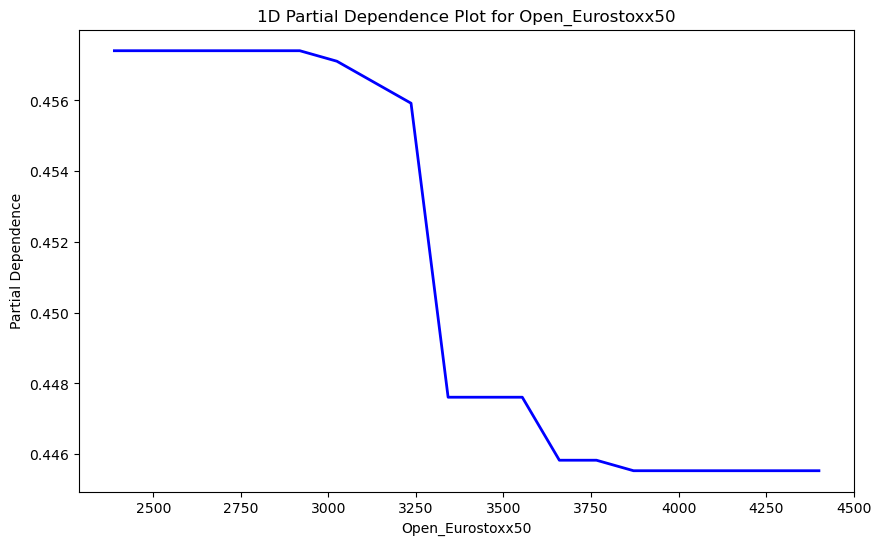

In [730]:
# PDP Plots (simplified call using the class method)
print("Running PDP Plots...")
pdp_explainer_lgb.plot_1d_pdp()

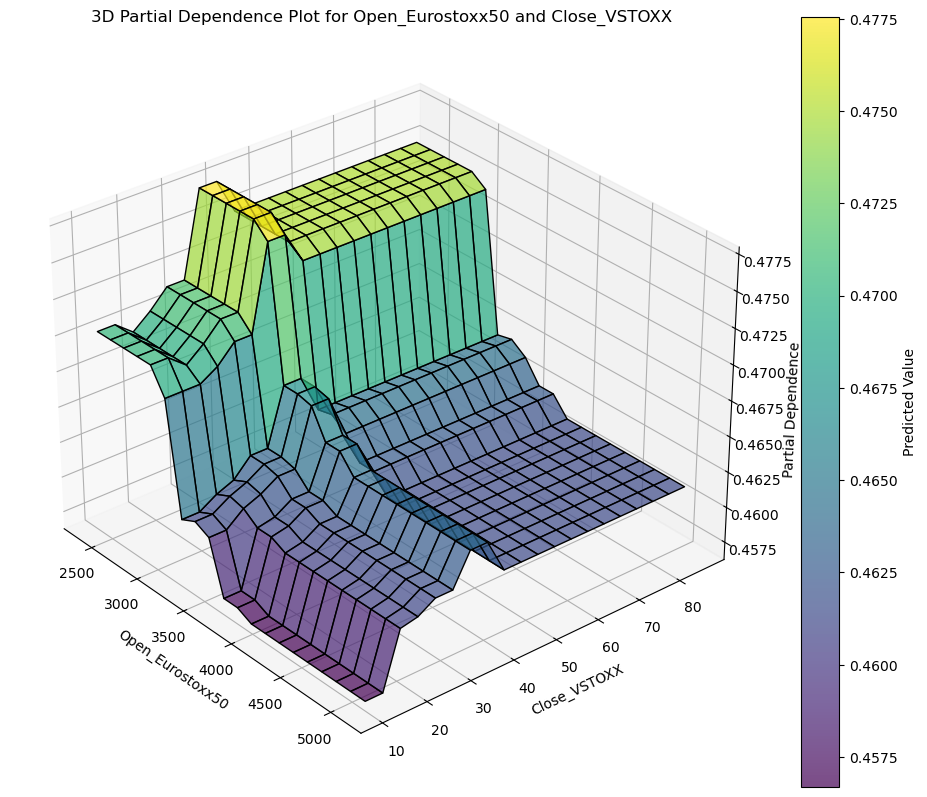

In [734]:
pdp_explainer.plot_3d_pdp()

In [750]:
# Initialize the AnchorExplainer with your trained model and dataset
anchor_explainer = AnchorExplainer(model=lgb_model, data=full_dataset[feature_columns])
# Generate an Anchor explanation for the first instance in the dataset
anchor_explainer.explain_instance(instance_index=8)
# Display feature importance and precision for the same instance
anchor_explainer.plot_feature_importance(instance_index=8)


Anchor Explanation:
['Eurostoxx50_Returns > 0.01', 'VSTOXX_RSI > 38.73', 'Basel Temperature Mean_BaselTemp > 12.60', 'Eurostoxx50_RSI > 66.28']
0.9568627450980393


In [406]:
# Add a feature importance ranking summary table comparing all models
lgb_feature_importance = pd.DataFrame({'Feature': X_train.columns, 'Importance': best_lgb_model.feature_importances_}).sort_values(by='Importance', ascending=False)
cb_feature_importance = pd.DataFrame({'Feature': X_train.columns, 'Importance': best_cb_model.feature_importances_}).sort_values(by='Importance', ascending=False)
xgb_feature_importance = pd.DataFrame({'Feature': X_train.columns, 'Importance': best_xgb_model.feature_importances_}).sort_values(by='Importance', ascending=False)

print("Feature Importance Ranking - LightGBM")
print(lgb_feature_importance.head())
print("Feature Importance Ranking - CatBoost")
print(cb_feature_importance.head())
print("Feature Importance Ranking - XGBoost")
print(xgb_feature_importance.head())



Feature Importance Ranking - LightGBM
                              Feature  Importance
10                Eurostoxx50_Returns        1038
13  Eurostoxx50_Cumulative_5D_Returns         406
2                  Volume_Eurostoxx50         311
11       Eurostoxx50_GARCH_Volatility         177
12            VSTOXX_GARCH_Volatility         158
Feature Importance Ranking - CatBoost
                              Feature  Importance
10                Eurostoxx50_Returns   49.533804
13  Eurostoxx50_Cumulative_5D_Returns    8.024761
2                  Volume_Eurostoxx50    5.573886
12            VSTOXX_GARCH_Volatility    4.067786
11       Eurostoxx50_GARCH_Volatility    3.391499
Feature Importance Ranking - XGBoost
                              Feature  Importance
10                Eurostoxx50_Returns    0.393728
2                  Volume_Eurostoxx50    0.044875
19                         VSTOXX_RSI    0.035662
13  Eurostoxx50_Cumulative_5D_Returns    0.035348
1                   Close_Eurostoxx50

In [738]:
# Add a correlation matrix for feature importance across the models
feature_importance_combined = pd.merge(lgb_feature_importance, cb_feature_importance, on='Feature', suffixes=('_lgb', '_cb'))
feature_importance_combined = pd.merge(feature_importance_combined, xgb_feature_importance, on='Feature')
feature_importance_combined.columns = ['Feature', 'Importance_lgb', 'Importance_cb', 'Importance_xgb']
correlation_matrix = feature_importance_combined[['Importance_lgb', 'Importance_cb', 'Importance_xgb']].corr()

print("Feature Importance Correlation Matrix")
print(correlation_matrix)




Feature Importance Correlation Matrix
                Importance_lgb  Importance_cb  Importance_xgb
Importance_lgb        1.000000       0.961208        0.925043
Importance_cb         0.961208       1.000000        0.989470
Importance_xgb        0.925043       0.989470        1.000000


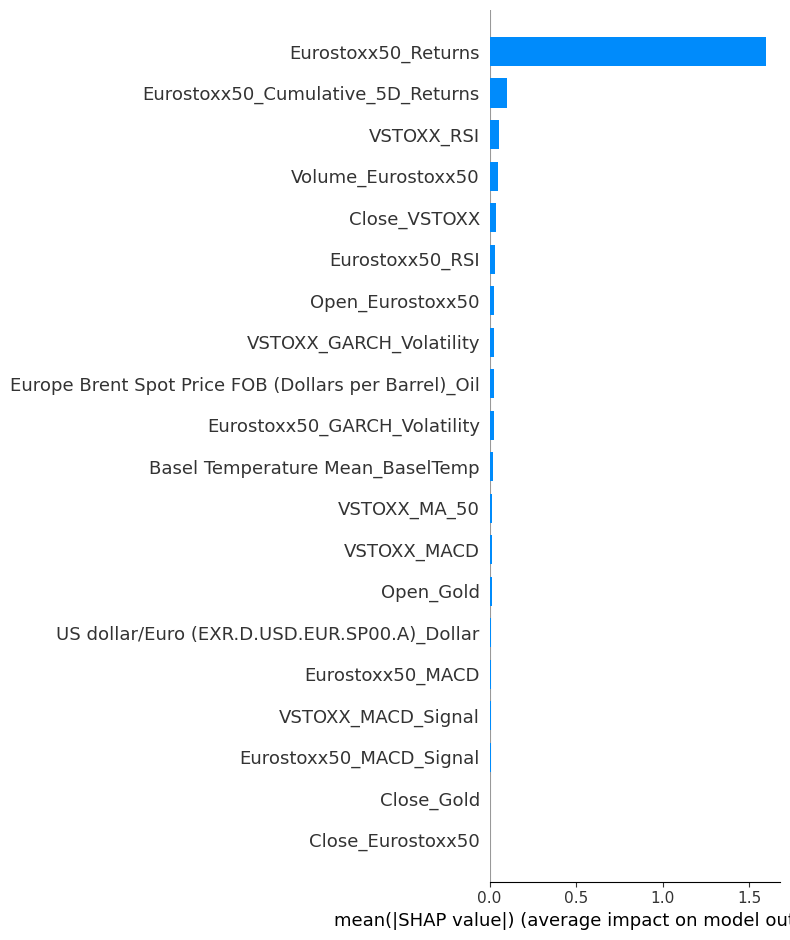

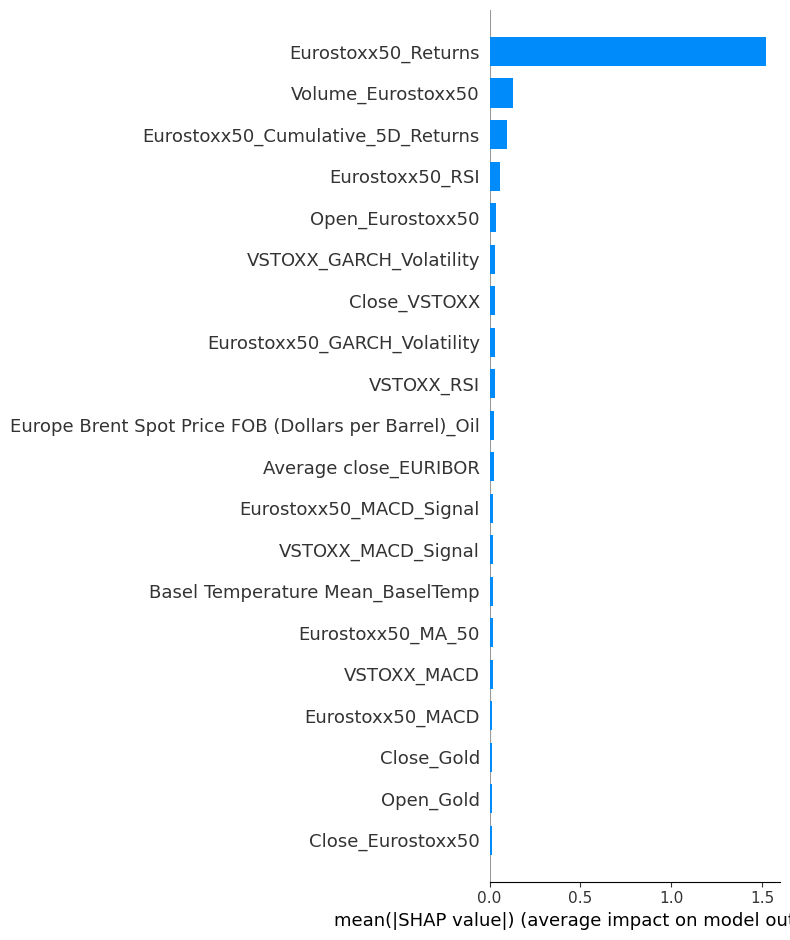

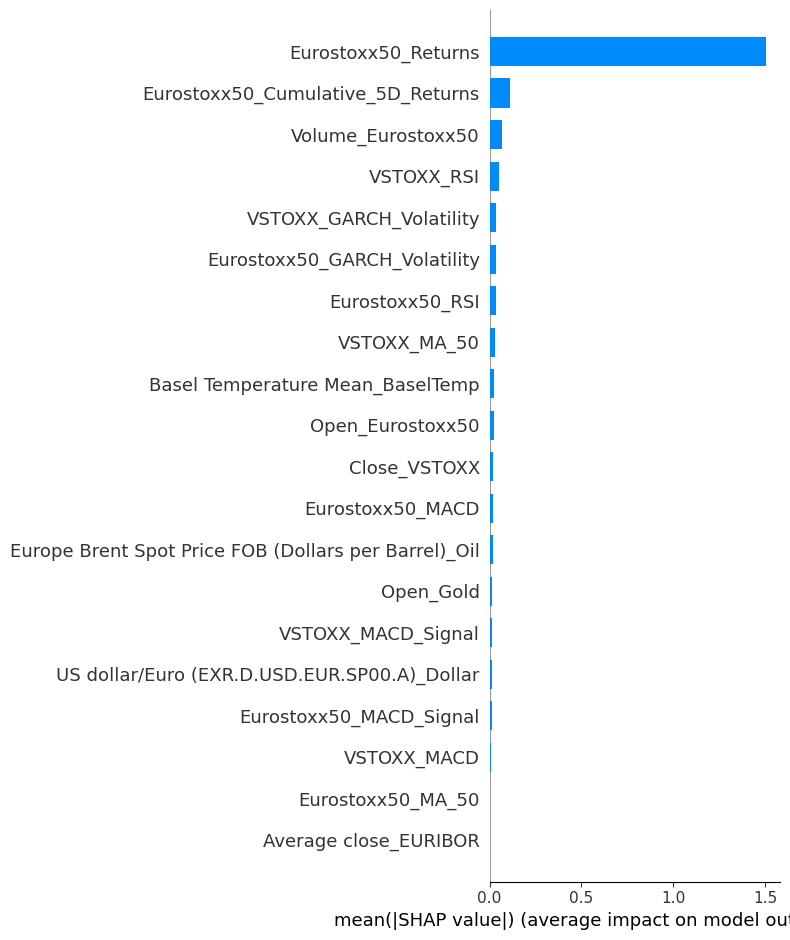

Top Features with Most Influence on Predictions
                              Feature  Importance
10                Eurostoxx50_Returns        1038
13  Eurostoxx50_Cumulative_5D_Returns         406
2                  Volume_Eurostoxx50         311
11       Eurostoxx50_GARCH_Volatility         177
12            VSTOXX_GARCH_Volatility         158
                              Feature  Importance
10                Eurostoxx50_Returns   49.533804
13  Eurostoxx50_Cumulative_5D_Returns    8.024761
2                  Volume_Eurostoxx50    5.573886
12            VSTOXX_GARCH_Volatility    4.067786
11       Eurostoxx50_GARCH_Volatility    3.391499
                              Feature  Importance
10                Eurostoxx50_Returns    0.393728
2                  Volume_Eurostoxx50    0.044875
19                         VSTOXX_RSI    0.035662
13  Eurostoxx50_Cumulative_5D_Returns    0.035348
1                   Close_Eurostoxx50    0.034925


In [410]:
# Plot aggregated SHAP values for each model to compare feature contributions
shap_values_lgb = shap_explainer_lgb.shap_values(X_test)
shap_values_cb = shap_explainer_cb.shap_values(X_test)
shap_values_xgb = shap_explainer_xgb.shap_values(X_test)

plt.figure(figsize=(12, 6))
shap.summary_plot(shap_values_lgb, X_test, plot_type='bar')
shap.summary_plot(shap_values_cb, X_test, plot_type='bar')
shap.summary_plot(shap_values_xgb, X_test, plot_type='bar')

# Highlight features with the most influence on predictions for each model
print("Top Features with Most Influence on Predictions")
print(lgb_feature_importance.head(5))
print(cb_feature_importance.head(5))
print(xgb_feature_importance.head(5))

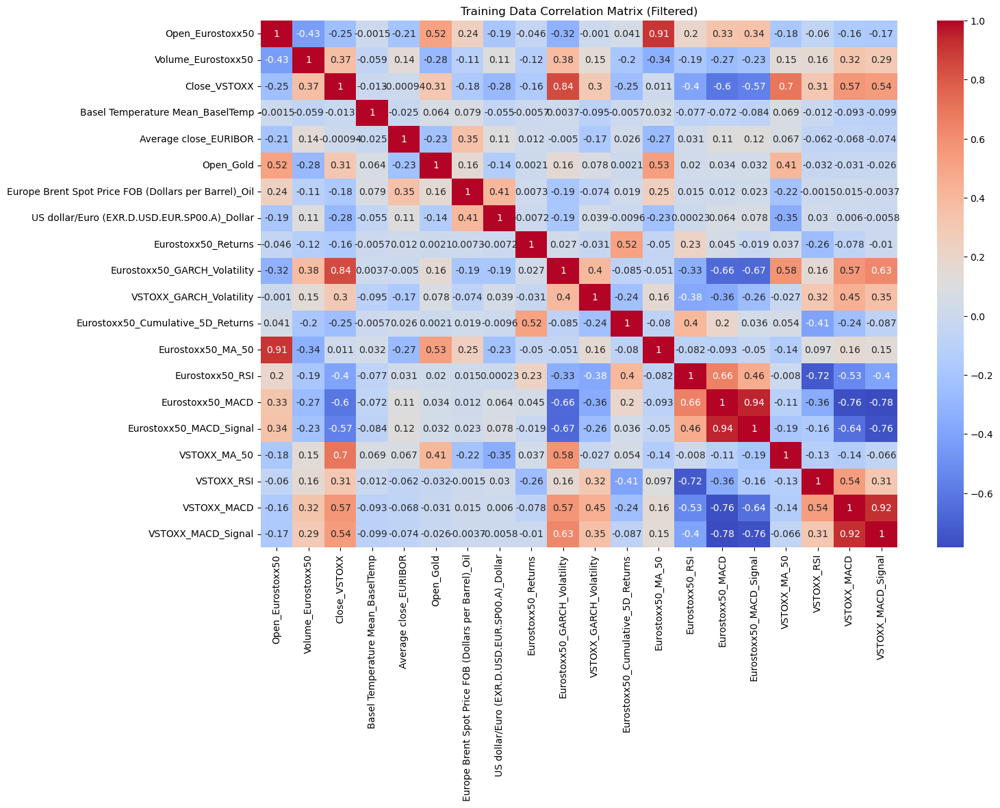

In [418]:
# Generate correlation matrix for the training data with option to exclude certain features
exclude_features = ['Close_Eurostoxx50', 'Close_Gold']  # Replace with features you want to exclude
included_features = [feature for feature in X_train.columns if feature not in exclude_features]
training_correlation_matrix = X_train[included_features].corr()
plt.figure(figsize=(15, 10))
sns.heatmap(training_correlation_matrix, annot=True, cmap="coolwarm")
plt.title("Training Data Correlation Matrix (Filtered)")
plt.show()



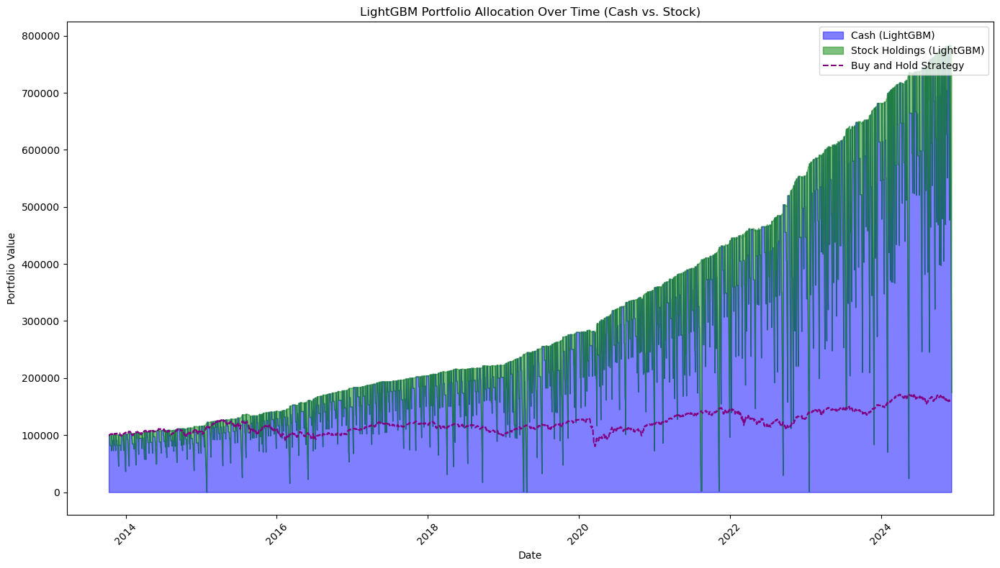

In [760]:
# LightGBM Portfolio
plt.figure(figsize=(14, 8))
lgb_cash = [entry['cash'] for entry in portfolio_lgb_tuned.portfolio_history]
lgb_invested = [entry['invested'] for entry in portfolio_lgb_tuned.portfolio_history]
lgb_dates = [entry['date'] for entry in portfolio_lgb_tuned.portfolio_history]

plt.fill_between(lgb_dates, lgb_cash, label='Cash (LightGBM)', color='blue', alpha=0.5)
plt.fill_between(lgb_dates, [lgb_cash[i] + lgb_invested[i] for i in range(len(lgb_cash))],
                 lgb_cash, label='Stock Holdings (LightGBM)', color='green', alpha=0.5)
plt.plot(full_dataset.index, [buy_and_hold_units * price for price in full_dataset['Open_Eurostoxx50']], 
         label='Buy and Hold Strategy', linestyle='--', color='purple')
plt.title('LightGBM Portfolio Allocation Over Time (Cash vs. Stock)')
plt.xlabel('Date')
plt.ylabel('Portfolio Value')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()